<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 15px; padding-bottom: 15px;"><b><b><span style='color:#99D8FF''></span></b> Welcome to our end-to-end classification and  unsupervised analysis project ! </b></p></div>

---
#### Team members :
> __Raz Elbaz__
>
> __Noa Anaki__

#### Git Link :
> __https://github.com/Razelbaz1/Machine-Learning-Project__

<hr>


<div style="text-align: center;">
<strong>context:</strong>
    
> The Ministry of Health, together with the overall healthcare system, is establishing a comprehensive dataset on the COVID-19 outbreak in Israel for the
>
>
>  benefit of research that will assist in dealing with the virus, preventing infection, improving public health, and treating patients.
>
> From the above database, we chose to take data that deals with statistical areas.
>
> In addition, we incorporated data from the Central Bureau of Statistics website, which adds columns indicating age ranges by statistical area as well as
>
> characteristics of the nature of the settlement, such as whether it is a Jewish or non-Jewish population and whether it is a town or a village, in order
>
> to enrich the ability to analyze trends and identify connections between demographic characteristics and morbidity data.
>
> This project required us to apply the majority of tools we acquired during the semester through the course "Advanced Topics in Machine Learning," taught by Dr. Chen Hajaj.
>
>  For most of the code, we utilized ChatGPT to enhance efficiency and reduce the workload of coding.
>
> We wish you a pleasant reading experience!





<hr>
<div style="text-align: center;">
<strong>dear reader:</strong>
 <br> For your convenience a table of contents is written here below.<br>
 <br><u>Content summary:</u><br>
 <br> <b>Chapter 1: Data Understanding and Merging</b> <br>
<br> In the first chapter of the notebook, we will primarily focus on understanding the raw data and merging the various tables into a single DataFrame.<br>
 <br> <b>Chapter 2: Data Preprocessing, Preparation for Classification & Anomaly Detection.</b> <br>
 <br> After understanding and merging the data, Chapter 2 serves as a standalone section, as it loads the unified and size-efficient dataset.<br> 
 <br> In this part, we will continue to process the data, perform data analysis, and apply various manipulations as preparation for classification tasks.<br> 
 <br> <b>Chapter 3: Unsupervised Analysis.</b> <br>
 <br>In this chapter, we will explore unsupervised learning techniques to identify hidden patterns and structures in the data.
<br> 
</div>

<hr>

# **Chapter 1.**

<a class="anchor" id='sec1'></a>

<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> Import relevant libraries. </b></p></div>

In [32]:
import pandas as pd
import requests
import numpy as np

<a class="anchor" id='sec2'></a>
<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> Reading data. </b></p></div>

In [33]:
### CODE BY GPT###
# GitHub API URL
url = 'https://api.github.com/repos/Razelbaz1/Machine-Learning-Project/contents/data/geographic-sum-per-day-ver_00859'
# Checking access to the site
response = requests.get(url)
data = response.json()
# Creating a list of relevant links
csv_files = [file['download_url'] for file in data if file['name'].endswith('.csv')]

####

In [34]:
### CODE BY GPT###
# Creating a list of relevant links
csv_files = [file['download_url'] for file in data if file['name'].endswith('.csv')]
csv_files

####

['https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-sum-per-day-ver_00859/part_1.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-sum-per-day-ver_00859/part_10.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-sum-per-day-ver_00859/part_2.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-sum-per-day-ver_00859/part_3.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-sum-per-day-ver_00859/part_4.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-sum-per-day-ver_00859/part_5.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-sum-per-day-ver_00859/part_6.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/geographic-su

In [35]:
### CODE BY GPT###
# משתנה לאחסון הנתונים
all_data = pd.DataFrame()

# לולאה לקריאת כל קובץ וחיבורו
for i, url in enumerate(csv_files):
    df = pd.read_csv(url, encoding='iso-8859-8')  # קריאת הקובץ ישירות מה-URL
    if i == 0:  # שמירת הכותרות רק מהקובץ הראשון
        all_data = df
    else:  # חיבור הקבצים ללא הכותרות
        all_data = pd.concat([all_data, df], ignore_index=True)

####

In [36]:
url = 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/refs/heads/master/data/all_pop.csv' # Central Bureau of Statistics data set
all_pop = pd.read_csv(url) 

<a class="anchor" id='sec3'></a>

<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> Wrangling data. </b></p></div>

In [37]:
all_data['date'].dtype

dtype('O')

In [38]:
all_data['date'] = pd.to_datetime(all_data.date)

In [39]:
all_data['date'].dtype

dtype('<M8[ns]')

In [40]:
cuvidDateTimeObj = pd.DatetimeIndex(all_data.date)
all_data['year'] = cuvidDateTimeObj.year

**The data we took from the Central Bureau of Statistics shows data up to 2022, so the project will take place between 2020 and 2022.**

In [41]:
all_data['year'].value_counts()

year
2022    604376
2021    603710
2020    489584
2023    245236
Name: count, dtype: int64

In [42]:
all_data = all_data[all_data['year'] != 2023]
all_data = all_data[all_data['town'] != 'נצרת עילית']

In [43]:
geo = all_data

<div style="background-color:#99D8FF; height: 5px; width: 100%; border-radius: 50px;"></div>

<div style="text-align: center;">
<strong>Columns handling:</strong> <code>agas_code</code>
</div>

**There are many cities without a `agas_code` classification. 
This challenge will complicate our classification process; however, based on the data explanation file attached to the project submission, we assume that locations with low population density were not classified into statistical areas in Israel. Therefore, we will not discard these rows. 
Instead, we will retain them and fill the missing values with a consistent random value.**

In [44]:
geo['agas_code'].isnull().sum()

np.int64(265734)

In [46]:
geo['agas_code']= geo['agas_code'].astype(pd.Int64Dtype())

In [47]:
geo['agas_code'] = geo['agas_code'].fillna(9999)

In [48]:
all_pop['agas_code'] = all_pop['agas_code'].astype(pd.Int64Dtype())

Creating a column for the total population will assist us in filling the missing values for the statistical areas later on.

In [49]:
# Create a new column for total population in each row
all_pop['total_population'] = all_pop['under_60'] + all_pop['over_60']

In [45]:
### CODE BY GPT###
# בדיקת שורות כפולות
duplicated_rows = geo[geo.duplicated()]

# הדפסת התוצאה
if not duplicated_rows.empty:
    print(f"Found {len(duplicated_rows)} duplicated rows:")
    print(duplicated_rows)
else:
    print("No duplicated rows found in the dataset.")

####

No duplicated rows found in the dataset.


**Since we are dealing with 2 different data files: matching city names must be maintained**

In [50]:
### CODE BY GPT###
# מילון עם שמות ערים שגויים ותיקונים
city_name_corrections = {
    "יהוד-מונוסון": "יהוד",
    "תל אביב -יפו": "תל אביב-יפו",
    "מודיעין-מכבים-רעות*"
    : "מודיעין-מכבים-רעות",
    "בנימינה-גבעת עדה*"
    : "בנימינה-גבעת עדה",
    # הוסף שמות שגויים ומתוקנים נוספים לפי הצורך
}
# פונקציה לתיקון שם העיר
def correct_city_name(city_name):
    return city_name_corrections.get(city_name, city_name)

# עדכון שמות הערים ב-missing
all_pop['town'] = all_pop['town'].apply(correct_city_name)

# הצגת הערכים המעודכנים
print("שמות הערים עודכנו בהצלחה!")

####

שמות הערים עודכנו בהצלחה!


In [51]:
geo_merged = geo.merge(all_pop, on=['agas_code', 'year', 'town_code'], how='left')

**Column arrangement after merging**

In [52]:
geo_merged.columns

Index(['town_code', 'agas_code', 'town_x', 'date', 'accumulated_cases',
       'new_cases_on_date', 'accumulated_recoveries', 'new_recoveries_on_date',
       'accumulated_hospitalized', 'new_hospitalized_on_date',
       'accumulated_deaths', 'new_deaths_on_date',
       'accumulated_diagnostic_tests', 'new_diagnostic_tests_on_date',
       'accumulated_vaccination_first_dose', 'new_vacc_first_dose_on_date',
       'accumulated_vaccination_second_dose', 'new_vacc_second_dose_on_date',
       'accumulated_vaccination_third_dose', 'new_vacc_third_dose_on_date',
       'year', 'style_code', 'town_y', 'under_60', 'over_60',
       'total_population'],
      dtype='object')

In [53]:
geo_merged.rename(columns = {'town_x': 'town'},inplace = True)

In [54]:
geo_merged.drop(columns=['town_y'], inplace=True)

In [55]:
# יצירת עותק של המיזוג כדי לא לפגוע בנתונים המקוריים
geo_merged = geo_merged.copy()

<div style="background-color:#99D8FF; height: 5px; width: 100%; border-radius: 50px;"></div>

<div style="text-align: center;">
<strong>Columns handling:</strong> <code>style_code</code>
</div>

<div style="text-align: center;">
<strong>The city symbol <code>(style_code)</code> needs to be completed as well.</strong>
</div>

<div style="text-align: center;">
<strong>Since all the values in the dataset from the Central Bureau of Statistics are complete, we created a dictionary for the town code to fill in the missing data in our dataset.</strong> <code></code>
</div>

In [56]:
# המרת עמודות לטיפוס חסכוני
geo_merged['town_code'] = geo_merged['town_code'].astype('int32')
geo_merged['agas_code'] = geo_merged['agas_code'].astype('int32')
geo_merged['town'] = geo_merged['town'].astype('category')

In [57]:
### CODE BY GPT###
# יצירת מילון עם הערכים הנפוצים ביותר של style_code לפי town_code
style_code_mapping = all_pop.groupby('town_code')['style_code'].apply(lambda x: x.mode()[0] if not x.mode().empty else None).to_dict()

# פונקציה למילוי ערכים חסרים
def fill_style_code(row):
    if pd.isnull(row['style_code']):
        return style_code_mapping.get(row['town_code'], None)
    return row['style_code']

# מילוי הערכים החסרים
geo_merged['style_code'] = geo_merged.apply(fill_style_code, axis=1)

# בדיקת התוצאה
print(geo_merged['style_code'].isnull().sum())

####

0


<div style="background-color:#99D8FF; height: 5px; width: 100%; border-radius: 50px;"></div>

<div style="text-align: center;">
<strong>Columns handling:</strong> <code>accumulated columns</code>
</div>

**Most of our columns are columns that represent cumulative values.**

**For advanced data analysis, we will create new columns that represent the differences between each recorded test.**

In [58]:
### CODE BY GPT###
# רשימת העמודות להמרה
columns_to_convert = [
    'accumulated_cases',
    'accumulated_recoveries',
    'accumulated_hospitalized',
    'accumulated_deaths',
    'accumulated_diagnostic_tests',
    'accumulated_vaccination_first_dose',
    'accumulated_vaccination_second_dose',
    'accumulated_vaccination_third_dose'
]

# החלפת הערכים '<15' ב-0
for column in columns_to_convert:
    geo_merged[column] = geo_merged[column].replace('<15', 0)

# בדיקת סוגי העמודות לאחר המרה
print(geo_merged[columns_to_convert].dtypes)

####

accumulated_cases                      object
accumulated_recoveries                 object
accumulated_hospitalized               object
accumulated_deaths                     object
accumulated_diagnostic_tests           object
accumulated_vaccination_first_dose     object
accumulated_vaccination_second_dose    object
accumulated_vaccination_third_dose     object
dtype: object


In [59]:
# המרת העמודות ל-int32
for column in columns_to_convert:
    geo_merged[column] = pd.to_numeric(geo_merged[column], errors='coerce').fillna(0).astype('int32')

In [60]:
print(geo_merged[columns_to_convert].dtypes)

accumulated_cases                      int32
accumulated_recoveries                 int32
accumulated_hospitalized               int32
accumulated_deaths                     int32
accumulated_diagnostic_tests           int32
accumulated_vaccination_first_dose     int32
accumulated_vaccination_second_dose    int32
accumulated_vaccination_third_dose     int32
dtype: object


In [61]:
geo_merged['town_code'] = geo_merged['town_code'].astype('category')
geo_merged['agas_code'] = geo_merged['agas_code'].astype('category')
geo_merged['style_code'] = geo_merged['style_code'].astype('int32')
geo_merged['style_code'] = geo_merged['style_code'].astype('category')

In [62]:
### CODE BY GPT###
# סידור הנתונים לפי תאריך, קוד עיר ואזור סטטיסטי
geo_merged = geo_merged.sort_values(by=['date', 'town_code', 'agas_code'])

# מציאת כל העמודות שמתחילות בשם 'accumulated'
accumulated_columns = [col for col in geo_merged.columns if col.startswith('accumulated')]

# יצירת עמודות חדשות להפרשים
for col in accumulated_columns:
    new_col_name = col.replace('accumulated', 'daily')  # שינוי השם לעמודת הפרשים
    # חישוב ההפרשים על בסיס סידור הנתונים
    geo_merged[new_col_name] = geo_merged.groupby(['town_code', 'agas_code'], observed=False)[col].diff()

# בדיקה של הנתונים לאחר הוספת עמודות ההפרשים
geo_merged.info()

####

<class 'pandas.core.frame.DataFrame'>
Index: 1684332 entries, 0 to 335485
Data columns (total 33 columns):
 #   Column                               Non-Null Count    Dtype         
---  ------                               --------------    -----         
 0   town_code                            1684332 non-null  category      
 1   agas_code                            1684332 non-null  category      
 2   town                                 1684332 non-null  category      
 3   date                                 1684332 non-null  datetime64[ns]
 4   accumulated_cases                    1684332 non-null  int32         
 5   new_cases_on_date                    1684332 non-null  bool          
 6   accumulated_recoveries               1684332 non-null  int32         
 7   new_recoveries_on_date               1684332 non-null  bool          
 8   accumulated_hospitalized             1684332 non-null  int32         
 9   new_hospitalized_on_date             1684332 non-null  bool    

In [63]:
### CODE BY GPT###
# מילוי ערכים חסרים ב-0 ושינוי טיפוס ל-int עבור עמודות ההפרשים
for col in geo_merged.columns:
    if col.startswith('daily'):  # רק עמודות שמתחילות ב-daily
        geo_merged[col] = geo_merged[col].fillna(0).astype(int)

# בדיקה לאחר העדכון
geo_merged.info()

# הצגת דוגמה של השורות הראשונות
geo_merged.head()

####

<class 'pandas.core.frame.DataFrame'>
Index: 1684332 entries, 0 to 335485
Data columns (total 33 columns):
 #   Column                               Non-Null Count    Dtype         
---  ------                               --------------    -----         
 0   town_code                            1684332 non-null  category      
 1   agas_code                            1684332 non-null  category      
 2   town                                 1684332 non-null  category      
 3   date                                 1684332 non-null  datetime64[ns]
 4   accumulated_cases                    1684332 non-null  int32         
 5   new_cases_on_date                    1684332 non-null  bool          
 6   accumulated_recoveries               1684332 non-null  int32         
 7   new_recoveries_on_date               1684332 non-null  bool          
 8   accumulated_hospitalized             1684332 non-null  int32         
 9   new_hospitalized_on_date             1684332 non-null  bool    

,town_code,agas_code,town,date,accumulated_cases,new_cases_on_date,accumulated_recoveries,new_recoveries_on_date,accumulated_hospitalized,new_hospitalized_on_date,...,over_60,total_population,daily_cases,daily_recoveries,daily_hospitalized,daily_deaths,daily_diagnostic_tests,daily_vaccination_first_dose,daily_vaccination_second_dose,daily_vaccination_third_dose
0,26,9999,ראש פינה,2020-03-11,0,False,0,False,0,False,...,672.0,3217.0,0,0,0,0,0,0,0,0
1026,28,9999,מזכרת בתיה,2020-03-11,0,False,0,False,0,False,...,1968.0,15093.0,0,0,0,0,0,0,0,0
2052,31,1,אופקים,2020-03-11,0,False,0,False,0,False,...,993.0,5247.0,0,0,0,0,0,0,0,0
3078,31,2,אופקים,2020-03-11,0,False,0,False,0,True,...,709.0,2824.0,0,0,0,0,0,0,0,0
4104,31,3,אופקים,2020-03-11,0,False,0,False,0,False,...,590.0,3040.0,0,0,0,0,0,0,0,0


<div style="background-color:#99D8FF; height: 5px; width: 100%; border-radius: 50px;"></div>

<div style="text-align: center;">
<strong>Columns handling:</strong> <code>population distribution columns</code>
</div>

**Cities without statistical areas (`agas_code`) did not receive their age distribution.**

The data merge was performed using the keys **town code**, **year**, and **statistical area code** (`agas_code`). However, some rows did not receive their population distribution due to mismatches in the data.

In [64]:
geo_merged['under_60'].isnull().sum()

np.int64(81715)

In [65]:
geo_merged['over_60'].isnull().sum()

np.int64(81715)

In [66]:
# זיהוי שורות עם ערכים חסרים
missing = geo_merged[geo_merged['under_60'].isna() | geo_merged['over_60'].isna()]
missing.shape

(81715, 33)

Before filling in the missing values, we will ensure that all the value names in the Central Bureau of Statistics file are also present in our dataset.

In [67]:
### CODE BY GPT###
# חילוץ שמות הערים משני המשתנים
missing_towns = set(missing['town'].unique())
all_pop_towns = set(all_pop['town'].unique())

# מציאת ערים ב-missing שלא קיימות ב-all_pop
missing_not_in_all_pop = missing_towns - all_pop_towns

# הדפסת התוצאה
if missing_not_in_all_pop:
    print("The following cities are present in missing but not in all_pop:")
    print(missing_not_in_all_pop)
else:
    print("All cities in missing exist in all_pop.")

####

All cities in missing exist in all_pop.


In [68]:
geo_merged['town'] = geo_merged['town'].astype('object')
geo_merged['year'] = geo_merged['year'].astype('int64')

In [69]:
# פילטור הערכים מ-all_pop לפי שנה ועיר, ושמירה כקבוצות
grouped_pop = all_pop.groupby(['town', 'year'])

**Since the population data in the statistical areas are divided into groups that are as homogeneous as possible:**

**Let us assume that the missing values in the age distribution are filled by random selection from the same city.**

For example, in a statistical area where one of the rows indicates 100 confirmed cases, it would be illogical for the population size to be less than 100.

In [70]:
### CODE BY GPT###
import warnings
warnings.filterwarnings('ignore')
# הגדרת מונה גלובלי
global else_count
else_count = 0

# פונקציה למילוי הערכים החסרים
def fill_missing(row):
    global else_count  # שימוש במונה גלובלי

    town = row['town']
    year = row['year']

    # פונקציה פנימית לבדיקה חוזרת של התנאי
    def is_valid_population(under_60, over_60):
        total_population = under_60 + over_60
        daily_columns = row.filter(like='daily').values  # כל העמודות המתחילות ב-"daily"
        return total_population >= daily_columns.max()  # בדיקה שהאוכלוסייה גדולה מכולן

    if (town, year) in grouped_pop.groups:
        # בחירת התפלגות של העיר והשנה
        group_data = grouped_pop.get_group((town, year))
        while True:  # לולאה לבחירה חוזרת עד שהנתונים יהיו תקינים
            under_60 = np.random.choice(group_data['under_60'])
            over_60 = np.random.choice(group_data['over_60'])
            if is_valid_population(under_60, over_60):
                break
    else:
        else_count += 1  # הגדלת המונה כשנכנסים ל-else
        under_60 = np.nan
        over_60 = np.nan

    row['under_60'] = under_60
    row['over_60'] = over_60
    return row

# מילוי ערכים חסרים בצורה וקטורית
geo_merged.loc[missing.index] = missing.apply(fill_missing, axis=1)

# הדפסת מספר השורות שנכנסו ל-else
print(f"מספר השורות שנכנסו ל-else: {else_count}")

# בדיקת הנתונים המלאים
geo_merged.head()
####

מספר השורות שנכנסו ל-else: 0


,town_code,agas_code,town,date,accumulated_cases,new_cases_on_date,accumulated_recoveries,new_recoveries_on_date,accumulated_hospitalized,new_hospitalized_on_date,...,over_60,total_population,daily_cases,daily_recoveries,daily_hospitalized,daily_deaths,daily_diagnostic_tests,daily_vaccination_first_dose,daily_vaccination_second_dose,daily_vaccination_third_dose
0,26,9999,ראש פינה,2020-03-11,0,False,0,False,0,False,...,672.0,3217.0,0,0,0,0,0,0,0,0
1026,28,9999,מזכרת בתיה,2020-03-11,0,False,0,False,0,False,...,1968.0,15093.0,0,0,0,0,0,0,0,0
2052,31,1,אופקים,2020-03-11,0,False,0,False,0,False,...,993.0,5247.0,0,0,0,0,0,0,0,0
3078,31,2,אופקים,2020-03-11,0,False,0,False,0,True,...,709.0,2824.0,0,0,0,0,0,0,0,0
4104,31,3,אופקים,2020-03-11,0,False,0,False,0,False,...,590.0,3040.0,0,0,0,0,0,0,0,0


In [71]:
print(geo_merged['under_60'].isnull().sum())
print(geo_merged['over_60'].isnull().sum())
print(geo_merged['style_code'].isnull().sum())

0
0
0


In [72]:
geo_merged[(geo_merged['under_60'] == 0) | (geo_merged['over_60'] == 0)]['town'].unique()

array(['ירושלים', 'חיפה', 'קריית גת', 'רמת השרון', 'קריית שמונה',
       'אשקלון', 'בית שמש', 'עפולה', 'בני ברק', 'ראשון לציון', 'רמת גן',
       'אשדוד', 'פתח תקווה', 'תל אביב-יפו', 'נתניה'], dtype=object)

A result of 0 values can **only** be logical if it appears in just **one** of the columns and satisfies the conditions of the other columns. 

In this case, we will not take risks and will ensure that the values are filled in both columns to prevent illogical infection ratios. 

A logical explanation for this can be found later in the notebook.

In [73]:
### CODE BY GPT###
# Define the global counter
global zero_population_count
zero_population_count = 0

# Function to fill rows where population distribution is 0
def fill_zero_population(row):
    global zero_population_count  # Use the global counter

    town = row['town']
    year = row['year']

    # Function to validate the population
    def is_valid_population(under_60, over_60):
        total_population = under_60 + over_60
        daily_columns = row.filter(like='daily').values  # All columns starting with "daily"
        return total_population >= daily_columns.max()  # Ensure population is greater than or equal to daily columns

    if (town, year) in grouped_pop.groups:
        # Get the group data for the town and year
        group_data = grouped_pop.get_group((town, year))
        while True:  # Loop until a valid population is chosen
            under_60 = np.random.choice(group_data['under_60'])
            over_60 = np.random.choice(group_data['over_60'])
            if is_valid_population(under_60, over_60):
                break
    else:
        zero_population_count += 1  # Increment the counter for unhandled cases
        under_60 = np.nan
        over_60 = np.nan

    row['under_60'] = under_60
    row['over_60'] = over_60
    return row

# Loop until all rows with zero population are handled
while True:
    # Identify rows where the population is 0
    zero_population_rows = geo_merged[(geo_merged['under_60'] == 0) | (geo_merged['over_60'] == 0)]

    if zero_population_rows.empty:
        break  # Exit loop if no rows with zero population remain

    # Apply the function only to rows with zero population
    geo_merged.loc[zero_population_rows.index] = zero_population_rows.apply(fill_zero_population, axis=1)

# Print the count of rows where the population was 0
print(f"Number of rows with zero population handled: {zero_population_count}")

# Verify the updates
print("Remaining towns with zero population:")
remaining_towns = geo_merged[(geo_merged['under_60'] == 0) | (geo_merged['over_60'] == 0)]['town'].unique()
print(remaining_towns)

####

Number of rows with zero population handled: 0
Remaining towns with zero population:
[]


In [74]:
geo_merged[(geo_merged['under_60'] == 0) & (geo_merged['over_60'] == 0)]['town'].unique()

array([], dtype=object)

In [75]:
print(geo_merged['under_60'].isnull().sum())
print(geo_merged['over_60'].isnull().sum())
print(geo_merged['style_code'].isnull().sum())

0
0
0


In [76]:
print(geo_merged[geo_merged['under_60'] == 0]['town'].unique())
print(geo_merged[geo_merged['over_60'] == 0]['town'].unique())

[]
[]


<div style="background-color:#99D8FF; height: 5px; width: 100%; border-radius: 50px;"></div>

<div style="text-align: center;">
<strong>Creating coordinate columns:</strong> 
</div>

**In this section, we used Google's API to get the coordinates of the cities by their names.**

**The code is presented in raw style for the sake of showing the path.**

**The API key has been removed for privacy reasons.**

In [46]:
# בדיקה כמה ערים ייחודיות יש בנתונים
unique_cities = geo_merged['town'].nunique()
print(f"Number of unique cities: {unique_cities}")


Number of unique cities: 259


In [78]:
coordinates_df_url = 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/refs/heads/master/data/coordinates_df.csv'
coordinates_df = pd.read_csv(coordinates_df_url)

In [79]:
# שלב 3: שילוב הנתונים החדשים עם geo_merged
geo_merged = geo_merged.merge(coordinates_df, on='town', how='left')

In [80]:
geo_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684332 entries, 0 to 1684331
Data columns (total 35 columns):
 #   Column                               Non-Null Count    Dtype         
---  ------                               --------------    -----         
 0   town_code                            1684332 non-null  category      
 1   agas_code                            1684332 non-null  category      
 2   town                                 1684332 non-null  object        
 3   date                                 1684332 non-null  datetime64[ns]
 4   accumulated_cases                    1684332 non-null  int64         
 5   new_cases_on_date                    1684332 non-null  bool          
 6   accumulated_recoveries               1684332 non-null  int64         
 7   new_recoveries_on_date               1684332 non-null  bool          
 8   accumulated_hospitalized             1684332 non-null  int64         
 9   new_hospitalized_on_date             1684332 non-null  bo

**Since we are dealing with large data and saving their variables costs us valuable memory storage:**
**we will delete the unwanted variables and re-read our clean data that we created.**

In [50]:
### CODE BY GPT###

import sys

# מציאת כל המשתנים בזיכרון וגודלם
variables = {var: sys.getsizeof(val) for var, val in globals().items() if not var.startswith('_')}

# מיון המשתנים לפי גודל
sorted_vars = sorted(variables.items(), key=lambda x: x[1], reverse=True)

# הצגת 10 המשתנים הכבדים ביותר
for var, size in sorted_vars[:10]:
    print(f"Variable: {var}, Size: {size / (1024 ** 2):.2f} MB")
####

Variable: all_data, Size: 904.84 MB
Variable: geo, Size: 904.84 MB
Variable: geo_merged, Size: 469.44 MB
Variable: df, Size: 112.22 MB
Variable: cuvidDateTimeObj, Size: 14.82 MB
Variable: missing, Size: 12.13 MB
Variable: all_pop, Size: 1.20 MB
Variable: style_code_mapping, Size: 0.04 MB
Variable: all_pop_towns, Size: 0.03 MB
Variable: coordinates_df, Size: 0.02 MB


In [51]:
### CODE BY GPT###

import gc

# מחיקת המשתנים
del all_data
del geo
del df
del missing
# הפעלת Garbage Collector לפינוי זיכרון
gc.collect()

# בדיקה מחודשת של המשתנים בזיכרון
variables = {var: sys.getsizeof(val) for var, val in globals().items() if not var.startswith('_')}
sorted_vars = sorted(variables.items(), key=lambda x: x[1], reverse=True)

# הצגת המשתנים הכבדים לאחר המחיקה
print("After Deletion:")
for var, size in sorted_vars[:10]:
    print(f"Variable: {var}, Size: {size / (1024 ** 2):.2f} MB")
####

After Deletion:
Variable: geo_merged, Size: 469.44 MB
Variable: cuvidDateTimeObj, Size: 14.82 MB
Variable: all_pop, Size: 1.20 MB
Variable: style_code_mapping, Size: 0.04 MB
Variable: all_pop_towns, Size: 0.03 MB
Variable: coordinates_df, Size: 0.02 MB
Variable: zero_population_rows, Size: 0.01 MB
Variable: missing_towns, Size: 0.01 MB
Variable: variables, Size: 0.00 MB
Variable: Out, Size: 0.00 MB


**After we have created the data and divided it into separate parts.**

**We can read it from the git hub again.**

In [81]:
for col in geo_merged.columns:
    if geo_merged[col].dtypes == np.int64:
        geo_merged[col] = geo_merged[col].astype('int32')

In [82]:
# Drop all columns that start with 'accumulated'
columns_to_drop = [col for col in geo_merged.columns if col.startswith('accumulated')]
geo_merged.drop(columns=columns_to_drop, inplace=True)

In [83]:
# Drop all columns that start with 'new'
columns_to_drop = [col for col in geo_merged.columns if col.startswith('new')]
geo_merged.drop(columns=columns_to_drop, inplace=True)
geo_merged.drop(columns= ['total_population'], inplace=True)

In [84]:
geo_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684332 entries, 0 to 1684331
Data columns (total 18 columns):
 #   Column                         Non-Null Count    Dtype         
---  ------                         --------------    -----         
 0   town_code                      1684332 non-null  category      
 1   agas_code                      1684332 non-null  category      
 2   town                           1684332 non-null  object        
 3   date                           1684332 non-null  datetime64[ns]
 4   year                           1684332 non-null  int32         
 5   style_code                     1684332 non-null  category      
 6   under_60                       1684332 non-null  float64       
 7   over_60                        1684332 non-null  float64       
 8   daily_cases                    1684332 non-null  int32         
 9   daily_recoveries               1684332 non-null  int32         
 10  daily_hospitalized             1684332 non-null  int32

From a single raw file size of 223 MB, we reached a final file after merging with additional data and creating columns to a size of 143 MB.

---
# **Chapter 2.**

<a class="anchor" id='sec2'></a>
<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> Classification. </b></p></div>

<a class="anchor" id='sec2'></a>
<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> Reading the cleaned data. </b></p></div>

In [162]:
import pandas as pd
import requests
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler ,OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import roc_curve, auc
from sklearn.ensemble import IsolationForest
from scipy.stats import f_oneway
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, classification_report, confusion_matrix
from sklearn.mixture import GaussianMixture


In [140]:
### CODE BY GPT###
# GitHub API URL
url = 'https://api.github.com/repos/Razelbaz1/Machine-Learning-Project/contents/data/clean_geo_df'
# Checking access to the site
response = requests.get(url)
data = response.json()

####

In [3]:
### CODE BY GPT###
# Creating a list of relevant links
csv_files = [file['download_url'] for file in data if file['name'].endswith('.csv')]
csv_files

####

['https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_1.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_2.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_3.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_4.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_5.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_6.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_7.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/clean_geo_df/part_8.csv']

In [4]:
### CODE BY GPT###
# משתנה לאחסון הנתונים
clean_geo_df = pd.DataFrame()

# לולאה לקריאת כל קובץ וחיבורו
for i, url in enumerate(csv_files):
    df = pd.read_csv(url, encoding='iso-8859-8')  # קריאת הקובץ ישירות מה-URL
    if i == 0:  # שמירת הכותרות רק מהקובץ הראשון
        clean_geo_df = df
    else:  # חיבור הקבצים ללא הכותרות
        clean_geo_df = pd.concat([clean_geo_df, df], ignore_index=True)

####

In [5]:
clean_geo_df.shape

(1684332, 18)

In [6]:
clean_geo_df['date'] = pd.to_datetime(clean_geo_df['date'])
clean_geo_df['date'] = pd.to_datetime(clean_geo_df['date'], format='%Y-%m-%d', errors='coerce')

In [7]:
# יצירת עמודת שבוע בשנה
cuvidDateTimeObj = pd.DatetimeIndex(clean_geo_df.date)
clean_geo_df['week_of_year'] = clean_geo_df['date'].dt.isocalendar().week

In [8]:
clean_geo_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684332 entries, 0 to 1684331
Data columns (total 19 columns):
 #   Column                         Non-Null Count    Dtype         
---  ------                         --------------    -----         
 0   town_code                      1684332 non-null  int64         
 1   agas_code                      1684332 non-null  int64         
 2   town                           1684332 non-null  object        
 3   date                           1684332 non-null  datetime64[ns]
 4   year                           1684332 non-null  int64         
 5   style_code                     1684332 non-null  int64         
 6   under_60                       1684332 non-null  float64       
 7   over_60                        1684332 non-null  float64       
 8   daily_cases                    1684332 non-null  int64         
 9   daily_recoveries               1684332 non-null  int64         
 10  daily_hospitalized             1684332 non-null  int64

<a class="anchor" id='sec2'></a>
<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> Anomaly Detection. </b></p></div>

In [198]:
clean_geo_annomaly_df = clean_geo_df.copy()

In [199]:
clean_geo_annomaly_df.drop(columns= ['week_of_year','town','year','latitude','longitude'], inplace=True)

In [200]:
clean_geo_annomaly_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1684332 entries, 0 to 1684331
Data columns (total 16 columns):
 #   Column                         Non-Null Count    Dtype         
---  ------                         --------------    -----         
 0   town_code                      1684332 non-null  int64         
 1   agas_code                      1684332 non-null  int64         
 2   date                           1684332 non-null  datetime64[ns]
 3   style_code                     1684332 non-null  int64         
 4   under_60                       1684332 non-null  float64       
 5   over_60                        1684332 non-null  float64       
 6   daily_cases                    1684332 non-null  int64         
 7   daily_recoveries               1684332 non-null  int64         
 8   daily_hospitalized             1684332 non-null  int64         
 9   daily_deaths                   1684332 non-null  int64         
 10  daily_diagnostic_tests         1684332 non-null  int64     

In [201]:
# Calculate the latest date in the dataset
latest_date = clean_geo_annomaly_df['date'].max()

# Create a new column 'days_from_latest' to represent the recency of each date
clean_geo_annomaly_df['days_from_latest'] = (latest_date - clean_geo_annomaly_df['date']).dt.days

In [202]:
clean_geo_annomaly_df.drop(columns= ['date'], inplace=True)

In [203]:
clean_geo_annomaly_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1684332 entries, 0 to 1684331
Data columns (total 16 columns):
 #   Column                         Non-Null Count    Dtype  
---  ------                         --------------    -----  
 0   town_code                      1684332 non-null  int64  
 1   agas_code                      1684332 non-null  int64  
 2   style_code                     1684332 non-null  int64  
 3   under_60                       1684332 non-null  float64
 4   over_60                        1684332 non-null  float64
 5   daily_cases                    1684332 non-null  int64  
 6   daily_recoveries               1684332 non-null  int64  
 7   daily_hospitalized             1684332 non-null  int64  
 8   daily_deaths                   1684332 non-null  int64  
 9   daily_diagnostic_tests         1684332 non-null  int64  
 10  daily_vaccination_first_dose   1684332 non-null  int64  
 11  daily_vaccination_second_dose  1684332 non-null  int64  
 12  daily_vaccination_t

In [204]:
# Applying get_dummies to the specified columns
columns_to_dummy = ['style_code', 'agas_code', 'town_code']
#clean_geo_annomaly_df_dummies = pd.get_dummies(clean_geo_annomaly_df, columns=columns_to_dummy, drop_first=True)
clean_geo_annomaly_df['style_code'] = clean_geo_annomaly_df['style_code'].astype('object')
clean_geo_annomaly_df['agas_code'] = clean_geo_annomaly_df['agas_code'].astype('object')
clean_geo_annomaly_df['town_code'] = clean_geo_annomaly_df['town_code'].astype('object')


In [205]:
clean_geo_annomaly_df['town_code'].nunique()

259

In [206]:
clean_geo_annomaly_df['agas_code'].nunique()

338

In [207]:
clean_geo_annomaly_df['style_code'].nunique()

17

In [208]:
### CODE BY GPT###

# Apply Label Encoding to 'agas_code'
label_encoder = LabelEncoder()
clean_geo_annomaly_df['agas_code'] = label_encoder.fit_transform(clean_geo_annomaly_df['agas_code'])

# Apply One-Hot Encoding to other categorical columns
categorical_cols = ['town_code', 'style_code']
clean_geo_annomaly_df = pd.get_dummies(clean_geo_annomaly_df, columns=categorical_cols, drop_first=True)

# Normalize numeric columns
numeric_cols = clean_geo_annomaly_df.select_dtypes(include=['int32', 'int64', 'float64']).columns
scaler = StandardScaler()
clean_geo_annomaly_df[numeric_cols] = scaler.fit_transform(clean_geo_annomaly_df[numeric_cols])

# Apply PCA without limiting components
pca = PCA()
pca_components = pca.fit_transform(clean_geo_annomaly_df)

# Calculate cumulative explained variance ratio
cumulative_variance = pca.explained_variance_ratio_.cumsum()
####

In [209]:
### CODE BY GPT###

# Calculate explained variance ratio with cumulative sum
explained_variance_ratio = pd.DataFrame({
    'Principal Component': [f'PC{i+1}' for i in range(len(pca.explained_variance_ratio_))],
    'Explained Variance Ratio': pca.explained_variance_ratio_.round(6),
    'Cumulative Explained Variance': pca.explained_variance_ratio_.cumsum()
})
# Display the explained variance ratio
explained_variance_ratio.head(20)

####

,Principal Component,Explained Variance Ratio,Cumulative Explained Variance
0,PC1,0.217047,0.217047
1,PC2,0.126006,0.343053
2,PC3,0.099599,0.442652
3,PC4,0.069616,0.512268
4,PC5,0.067095,0.579364
5,PC6,0.066353,0.645717
6,PC7,0.065259,0.710976
7,PC8,0.062600,0.773576
8,PC9,0.039349,0.812925
9,PC10,0.031696,0.844621


In [153]:
optimal_components_df  = explained_variance_ratio[explained_variance_ratio['Cumulative Explained Variance'] < 0.92]

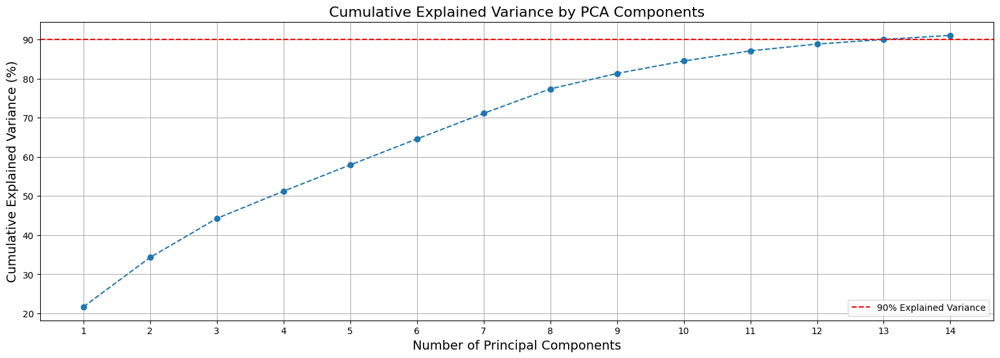

In [154]:
### CODE BY GPT###
# Create a cumulative Scree plot
plt.figure(figsize=(19, 6))
plt.plot(range(1, len(optimal_components_df['Cumulative Explained Variance']) + 1), optimal_components_df['Cumulative Explained Variance'] * 100, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by PCA Components', fontsize=16)
plt.xlabel('Number of Principal Components', fontsize=14)
plt.ylabel('Cumulative Explained Variance (%)', fontsize=14)
plt.xticks(range(1, len(optimal_components_df['Cumulative Explained Variance']) + 1))
plt.grid(True)
plt.axhline(y=90, color='r', linestyle='--', label='90% Explained Variance')
plt.legend()
plt.show()

####

C:\Users\razel\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


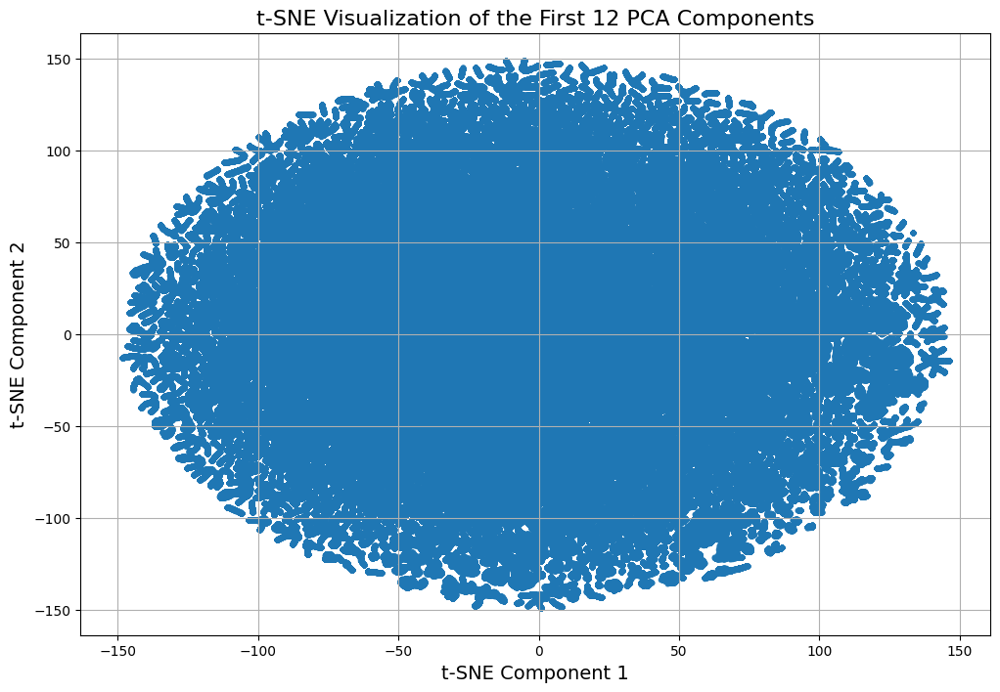

In [23]:
### CODE BY GPT###
# Select the first 14 PCA components
pca_selected_components = pca_components[:, :14]

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_result = tsne.fit_transform(pca_selected_components)

# Create a scatter plot of the t-SNE results
plt.figure(figsize=(12, 8))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], s=10, alpha=0.7)
plt.title("t-SNE Visualization of the First 12 PCA Components", fontsize=16)
plt.xlabel("t-SNE Component 1", fontsize=14)
plt.ylabel("t-SNE Component 2", fontsize=14)
plt.grid(True)
plt.show()
####

<h1 style="background-color: #FFFFFF; color: #0046d6; border-radius: 10px; text-align: center; padding-top: 10px; padding-bottom: 10px; font-family: 'Arial'" id="introduction"><img src="https://github.com/Razelbaz1/Machine-Learning-Project/blob/master/pics/T-sne%20result.png?raw=true" width="100%" height="100%" alt="Centered Image" /> <div  </h1>

In [155]:
### CODE BY GPT###
# GitHub API URL
url = 'https://api.github.com/repos/Razelbaz1/Machine-Learning-Project/contents/data/tsne_results_new'
# Checking access to the site
response = requests.get(url)
data = response.json()
####

In [156]:
### CODE BY GPT###
# Creating a list of relevant links
csv_files = [file['download_url'] for file in data if file['name'].endswith('.csv')]
csv_files
####

['https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/tsne_results_new/part_1.csv',
 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/master/data/tsne_results_new/part_2.csv']

In [157]:
### CODE BY GPT###
# משתנה לאחסון הנתונים
tsne_result = pd.DataFrame()

# לולאה לקריאת כל קובץ וחיבורו
for i, url in enumerate(csv_files):
    df = pd.read_csv(url)  # קריאת הקובץ ישירות מה-URL
    if i == 0:  # שמירת הכותרות רק מהקובץ הראשון
        tsne_result = df
    else:  # חיבור הקבצים ללא הכותרות
        tsne_result = pd.concat([tsne_result, df], ignore_index=True)
tsne_result = tsne_result.values
####

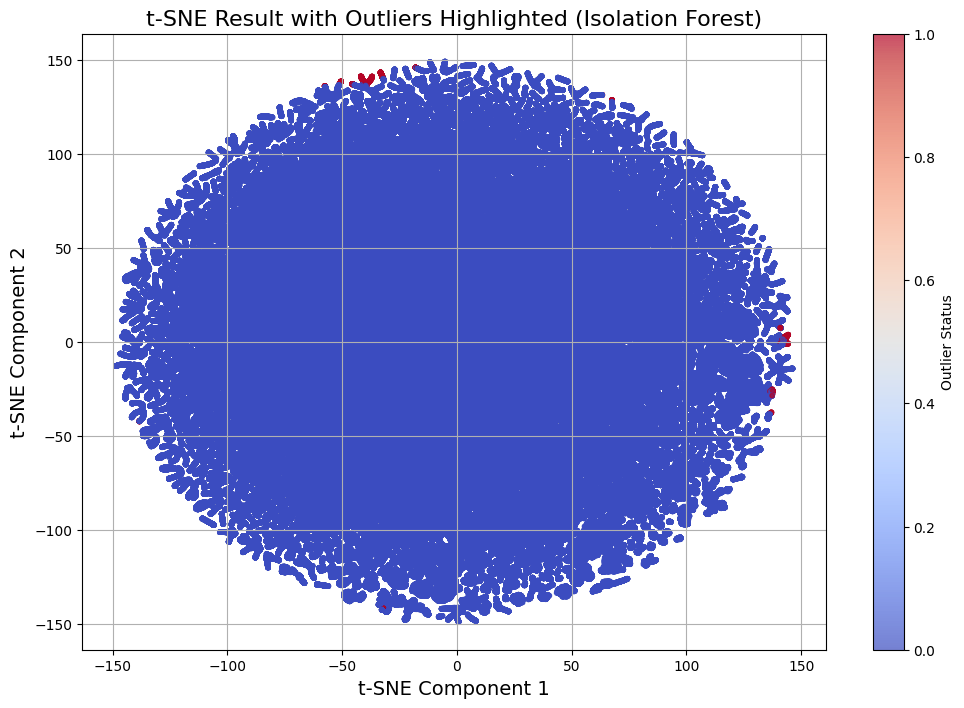

In [158]:
### CODE BY GPT###
# Apply Isolation Forest on the t-SNE result
iso_forest = IsolationForest(contamination=0.001, random_state=42)
outlier_labels = iso_forest.fit_predict(tsne_result)

# Identify outliers (labeled as -1)
outliers = outlier_labels == -1

# Visualize the t-SNE result with outliers highlighted
plt.figure(figsize=(12, 8))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=outliers, cmap='coolwarm', s=10, alpha=0.7)
plt.title("t-SNE Result with Outliers Highlighted (Isolation Forest)", fontsize=16)
plt.xlabel("t-SNE Component 1", fontsize=14)
plt.ylabel("t-SNE Component 2", fontsize=14)
plt.colorbar(label="Outlier Status")
plt.grid(True)
plt.show()
####

In [159]:
# Save the indices of the outliers identified by Isolation Forest
outlier_indices = [index for index, is_outlier in enumerate(outliers) if is_outlier]

# Display the list of outlier indices
len(outlier_indices)

1671

In [160]:
clean_geo_annomaly_df_outliers_tsne = clean_geo_df[clean_geo_df.index.isin(outlier_indices)]

In [163]:
### CODE BY GPT###
# Filtered list of columns for ANOVA
columns_for_anova = [
    'town_code', 'agas_code', 'style_code', 'under_60', 'over_60',
    'daily_cases', 'daily_recoveries', 'daily_hospitalized',
    'daily_deaths', 'daily_diagnostic_tests',
    'daily_vaccination_first_dose', 'daily_vaccination_second_dose',
    'daily_vaccination_third_dose'
]

# Group of outliers
outliers = clean_geo_annomaly_df_outliers_tsne

# Group of non-outliers
non_outliers = clean_geo_df.drop(outliers.index)

# Store ANOVA results
anova_results = {}

# Perform ANOVA for selected columns
for col in columns_for_anova:
    f_stat, p_value = f_oneway(outliers[col], non_outliers[col])
    anova_results[col] = {'F-Statistic': f_stat, 'p-value': p_value}

# Convert the results to a DataFrame
anova_df = pd.DataFrame.from_dict(anova_results, orient='index')

# Filter columns with significant p-value
significant_columns = anova_df[anova_df['p-value'] < 0.05]

# Style the table for visualization
significant_columns_styled_table = significant_columns.style.background_gradient(cmap='Blues')

significant_columns_styled_table
####

,F-Statistic,p-value
town_code,6.703613,0.009622
agas_code,182.944323,0.000000
style_code,177.581652,0.000000
under_60,31.890531,0.000000
over_60,519.288832,0.000000
daily_cases,59.877113,0.000000
daily_recoveries,35.511562,0.000000
daily_hospitalized,114179.595628,0.000000
daily_diagnostic_tests,4.382308,0.036314
daily_vaccination_first_dose,66.372419,0.000000


---

In [181]:
# Apply Isolation Forest
iso_forest = IsolationForest(contamination=0.001, random_state=42, n_jobs=-1)
iso_forest.fit(clean_geo_annomaly_df)

# Predict outliers (-1 for outliers, 1 for inliers)
iso_outliers = iso_forest.predict(clean_geo_annomaly_df)

# Add the outlier status to the DataFrame
clean_geo_annomaly_df['is_outlier'] = (iso_outliers == -1)


In [182]:
clean_geo_annomaly_df['is_outlier'].value_counts()

is_outlier
False    1682647
True        1685
Name: count, dtype: int64

In [183]:
# Save the indices of the outliers identified by Isolation Forest
outlier_indices = [index for index, is_outlier in enumerate(clean_geo_annomaly_df['is_outlier']) if is_outlier]

# Display the list of outlier indices
len(outlier_indices)

1685

In [184]:
# Filter original rows based on outlier indices from normalized data
outlier_indices_normalized = clean_geo_annomaly_df[clean_geo_annomaly_df['is_outlier']].index
outliers_normalized = clean_geo_df.loc[outlier_indices_normalized]

In [185]:
# Filtered list of columns for ANOVA
columns_for_anova = [
    'town_code', 'agas_code', 'style_code', 'under_60', 'over_60',
    'daily_cases', 'daily_recoveries', 'daily_hospitalized',
    'daily_deaths', 'daily_diagnostic_tests',
    'daily_vaccination_first_dose', 'daily_vaccination_second_dose',
    'daily_vaccination_third_dose'
]

# Group of outliers
outliers = outliers_normalized

# Group of non-outliers
non_outliers = clean_geo_df.drop(outliers.index)

# Store ANOVA results
anova_results = {}

# Perform ANOVA for selected columns
for col in columns_for_anova:
    f_stat, p_value = f_oneway(outliers[col], non_outliers[col])
    anova_results[col] = {'F-Statistic': f_stat, 'p-value': p_value}

# Convert the results to a DataFrame
anova_df = pd.DataFrame.from_dict(anova_results, orient='index')

# Filter columns with significant p-value
significant_columns = anova_df[anova_df['p-value'] < 0.05]

# Style the table for visualization
significant_columns_styled_table = significant_columns.style.background_gradient(cmap='Blues')

significant_columns_styled_table

,F-Statistic,p-value
town_code,51.072717,0.000000
agas_code,3197.895446,0.000000
style_code,3475.241799,0.000000
under_60,49812.058985,0.000000
over_60,30389.458333,0.000000
daily_cases,339969.649415,0.000000
daily_recoveries,263963.414984,0.000000
daily_hospitalized,7402.449835,0.000000
daily_deaths,1793.182435,0.000000
daily_diagnostic_tests,283918.041281,0.000000


---

# 2D Func.

In [186]:
# יצירת DataFrame עבור כל רכיבי ה-PCA
pca_all_components_df = pd.DataFrame(
    pca_components,  # כל רכיבי ה-PCA
    columns=[f'PC{i+1}' for i in range(pca_components.shape[1])],  # שמות העמודות PC1, PC2, ...
    index=clean_geo_annomaly_df.index  # שמירת האינדקסים המקוריים
)


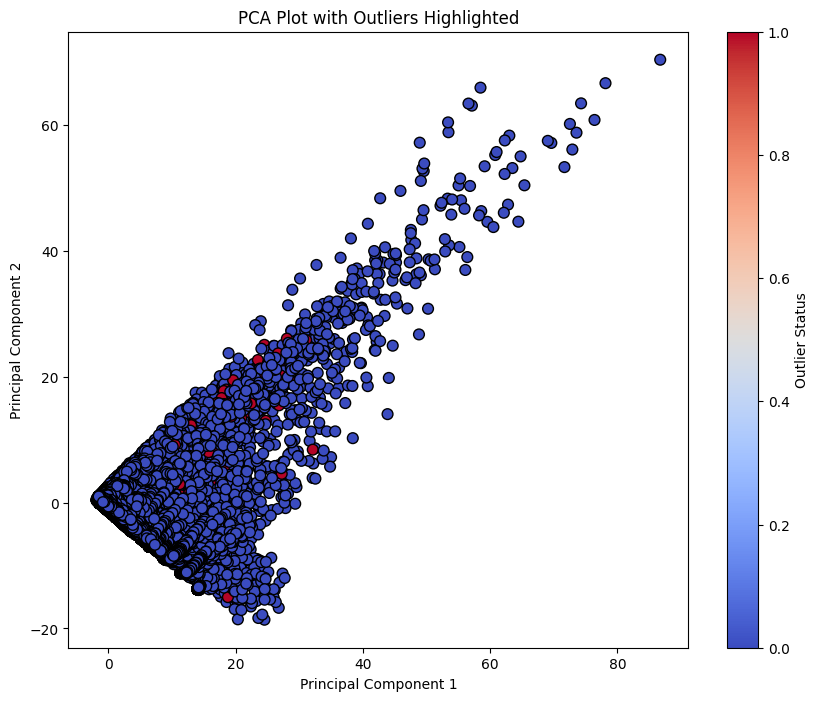

In [187]:
### CODE BY GPT###
def process_and_identify_outliers(data, contamination=0.05):
    """
    Detects outliers using Isolation Forest and highlights them in a PCA scatter plot.
    
    Parameters:
    - data: DataFrame of PCA components with indices and columns.
    - contamination: Proportion of outliers in the data (default 0.05).
    
    Returns:
    - outlier_indices: List of indices of the detected outliers.
    """
    # Step 1: Apply Isolation Forest
    outliers_if = IsolationForest(contamination=contamination, random_state=42)
    outliers_if_pred = outliers_if.fit_predict(data)  # Predict outliers
    
    # Step 2: Create a scatter plot of the first two PCA components
    plt.figure(figsize=(10, 8))
    plt.scatter(
        data.iloc[:, 0],  # First PCA component
        data.iloc[:, 1],  # Second PCA component
        c=(outliers_if_pred == -1),  # Highlight outliers in color
        cmap='coolwarm',
        edgecolors='k',
        s=60
    )
    plt.title("PCA Plot with Outliers Highlighted")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.colorbar(label="Outlier Status")
    plt.show()
    
    # Step 3: Return the indices of the outliers
    outlier_indices = data.index[outliers_if_pred == -1].tolist()
    return outlier_indices

# Example Usage
# Assuming `pca_selected_components_14_df` is your PCA DataFrame
res = process_and_identify_outliers(pca_all_components_df, contamination=0.001)
####

In [188]:
len(res)

1680

In [189]:
clean_geo_annomaly_df_outliers_pca = clean_geo_df[clean_geo_df.index.isin(res)]
clean_geo_annomaly_df_outliers_pca.shape

(1680, 21)

In [190]:
### CODE BY GPT###
# Filtered list of columns for ANOVA
columns_for_anova = [
    'town_code', 'agas_code', 'style_code', 'under_60', 'over_60',
    'daily_cases', 'daily_recoveries', 'daily_hospitalized',
    'daily_deaths', 'daily_diagnostic_tests',
    'daily_vaccination_first_dose', 'daily_vaccination_second_dose',
    'daily_vaccination_third_dose'
]

# Group of outliers
outliers = clean_geo_annomaly_df_outliers_pca

# Group of non-outliers
non_outliers = clean_geo_df.drop(outliers.index)

# Store ANOVA results
anova_results = {}

# Perform ANOVA for selected columns
for col in columns_for_anova:
    f_stat, p_value = f_oneway(outliers[col], non_outliers[col])
    anova_results[col] = {'F-Statistic': f_stat, 'p-value': p_value}

# Convert the results to a DataFrame
anova_df = pd.DataFrame.from_dict(anova_results, orient='index')

# Filter columns with significant p-value
significant_columns = anova_df[anova_df['p-value'] < 0.05]

# Style the table for visualization
significant_columns_styled_table = significant_columns.style.background_gradient(cmap='Blues')

significant_columns_styled_table
####

,F-Statistic,p-value
town_code,2724.300570,0.000000
agas_code,8919.609874,0.000000
style_code,9591.320860,0.000000
under_60,11503.134985,0.000000
over_60,6578.538098,0.000000
daily_cases,7330.566641,0.000000
daily_recoveries,6035.844543,0.000000
daily_hospitalized,742.483804,0.000000
daily_deaths,117.490922,0.000000
daily_diagnostic_tests,8246.119695,0.000000


---

In [191]:
clean_geo_annomaly_df_outliers_original_data = pd.read_csv('https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/refs/heads/master/data/clean_geo_annomaly_df_outliers_original_data.csv', index_col='Unnamed: 0')
clean_geo_annomaly_df_outliers_pca = pd.read_csv('https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/refs/heads/master/data/clean_geo_annomaly_df_outliers_pca.csv', index_col='Unnamed: 0')
clean_geo_annomaly_df_outliers_tsne = pd.read_csv('https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/refs/heads/master/data/clean_geo_annomaly_df_outliers_tsne.csv', index_col='Unnamed: 0')

In [192]:
# Finding the intersection and partial unions of indices
index1 = set(clean_geo_annomaly_df_outliers_original_data.index)
index2 = set(clean_geo_annomaly_df_outliers_pca.index)
index3 = set(clean_geo_annomaly_df_outliers_tsne.index)

In [193]:
# Intersection of all three sets
intersection_all = index1 & index2 & index3

# Union of indices appearing in at least two sets
partial_union = (index1 & index2) | (index1 & index3) | (index2 & index3)

# Display results
results = {
    "Intersection of All Sets": len(intersection_all),
    "Partial Union (At Least Two Sets)": len(partial_union),
}
results

{'Intersection of All Sets': 0, 'Partial Union (At Least Two Sets)': 45}

In [194]:
clean_geo_annomaly_df_outliers_Partial_Union = clean_geo_df[clean_geo_df.index.isin(partial_union)]
clean_geo_annomaly_df_outliers_Partial_Union['style_code'].unique()
clean_geo_annomaly_df_outliers_Partial_Union['style_code'].value_counts()

style_code
260    40
150     4
130     1
Name: count, dtype: int64

In [195]:
### CODE BY GPT###
# Filtered list of columns for ANOVA
columns_for_anova = [
    'town_code', 'agas_code', 'style_code', 'under_60', 'over_60',
    'daily_cases', 'daily_recoveries', 'daily_hospitalized',
    'daily_deaths', 'daily_diagnostic_tests',
    'daily_vaccination_first_dose', 'daily_vaccination_second_dose',
    'daily_vaccination_third_dose'
]

# Group of outliers
outliers = clean_geo_annomaly_df_outliers_Partial_Union

# Group of non-outliers
non_outliers = clean_geo_df.drop(outliers.index)

# Store ANOVA results
anova_results = {}

# Perform ANOVA for selected columns
for col in columns_for_anova:
    f_stat, p_value = f_oneway(outliers[col], non_outliers[col])
    anova_results[col] = {'F-Statistic': f_stat, 'p-value': p_value}

# Convert the results to a DataFrame
anova_df = pd.DataFrame.from_dict(anova_results, orient='index')

# Filter columns with significant p-value
significant_columns = anova_df[anova_df['p-value'] < 0.05]

# Style the table for visualization
significant_columns_styled_table = significant_columns.style.background_gradient(cmap='Blues')

significant_columns_styled_table
####

,F-Statistic,p-value
agas_code,177.920053,0.000000
style_code,292.883267,0.000000
under_60,959.428400,0.000000
over_60,523.270973,0.000000
daily_cases,13107.678786,0.000000
daily_recoveries,11317.944364,0.000000
daily_hospitalized,1335.493397,0.000000
daily_deaths,443.787843,0.000000
daily_diagnostic_tests,6561.564073,0.000000
daily_vaccination_first_dose,360.493843,0.000000


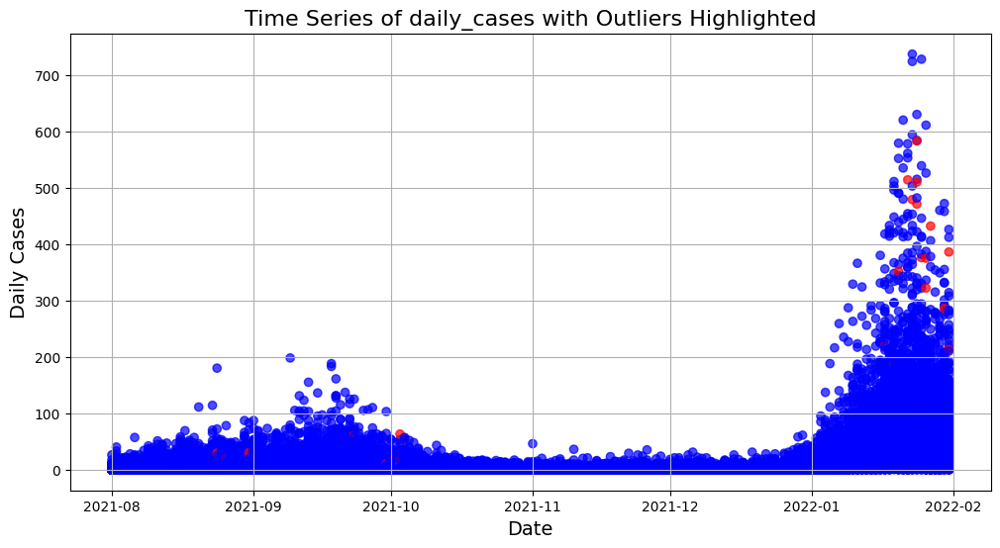

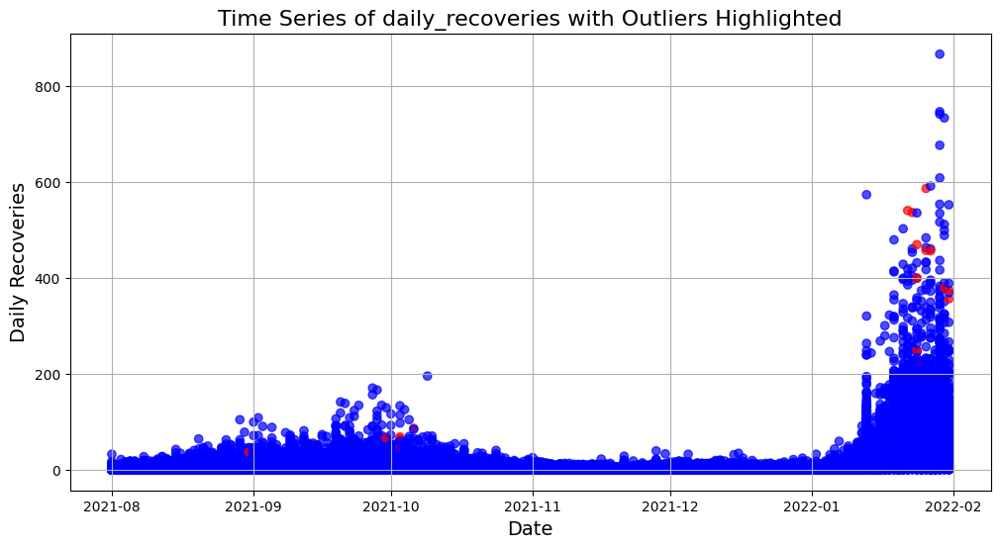

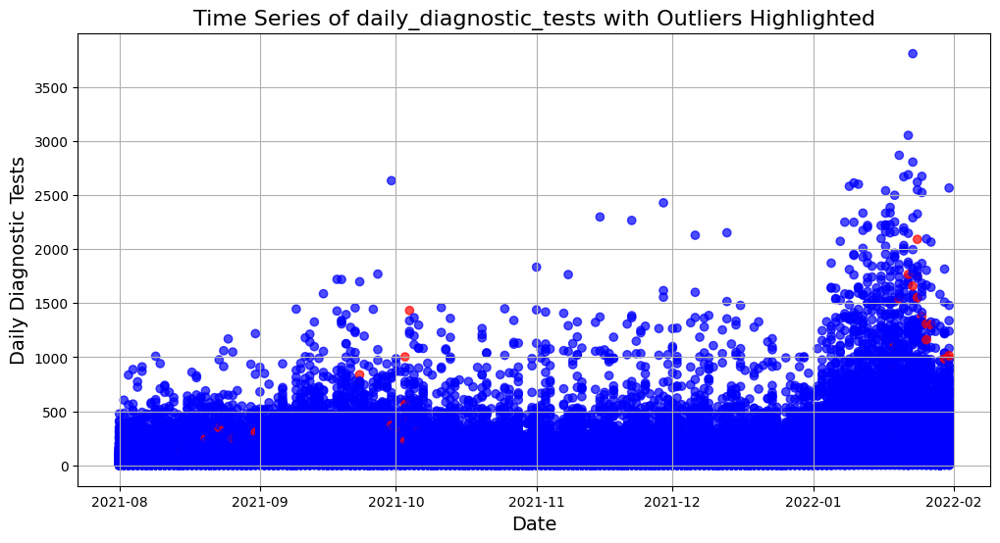

In [197]:
### CODE BY GPT###
# Combine indices of outliers
outlier_indices = set(clean_geo_annomaly_df_outliers_Partial_Union.index)


# Define the time range
start_date = '2021-08-01'
end_date = '2022-01-31'

# Extract relevant data
clean_geo_df['date'] = pd.to_datetime(clean_geo_df['date'])
data = clean_geo_df[(clean_geo_df['date'] >= start_date) & (clean_geo_df['date'] <= end_date)]

# Plot for each column
columns_to_plot = ['daily_cases', 'daily_recoveries', 'daily_diagnostic_tests']
for column in columns_to_plot:
    plt.figure(figsize=(12, 6))
    plt.scatter(
        data['date'], data[column],
        color=['red' if idx in outlier_indices else 'blue' for idx in data.index],
        alpha=0.7, label='Data Points'
    )
    plt.title(f"Time Series of {column} with Outliers Highlighted", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel(column.replace('_', ' ').title(), fontsize=14)
    plt.grid(True)
    plt.show()
####

<a class="anchor" id='sec2'></a>
<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> EDA and Feature Engineering. </b></p></div>

In this section, we will analyze the data according to our project requirements and assumptions. 

The creation of some columns was inspired by past articles about COVID-19 in Israel.

We will generate a general statistical analysis table for our dataset to explore various statistical parameters and gain insights into the data.


In [9]:
### CODE BY GPT###

# Create a new column for total population in each row
clean_geo_df['total_population'] = clean_geo_df['under_60'] + clean_geo_df['over_60']

# Group the data by 'agas_code' (statistical area) and calculate summary statistics
stats_per_area = clean_geo_df.groupby(['town_code','agas_code']).agg(
    average_population=('total_population', 'mean'),  # Assuming 'under_60' + 'over_60' = population
    min_daily_cases=('daily_cases', 'min'),
    max_daily_cases=('daily_cases', 'max'),
    average_daily_cases=('daily_cases', 'mean'),
    std_daily_cases=('daily_cases', 'std'),
    total_cases=('daily_cases', 'sum'),
    outlier_cases=('daily_cases', lambda x: ((x > x.mean() + 3 * x.std()) | (x < x.mean() - 3 * x.std())).sum()),
    average_tests=('daily_diagnostic_tests', 'mean'),
    std_tests=('daily_diagnostic_tests', 'std'),
    total_tests=('daily_diagnostic_tests', 'sum')
).reset_index()

# Fill missing values (e.g., std for single observations) with 0
stats_per_area.fillna(0, inplace=True)

# Style the dataframe for better visualization
styled_table = stats_per_area.style.background_gradient(cmap='Oranges')
####


In [10]:
styled_table

### Converting Data to Weekly Terms

We made a decision to analyze the data on a **weekly basis** instead of daily to reduce the data load and save valuable runtime resources, which are either limited or unavailable to us.

In [11]:
# Calculate custom week numbers, resetting the count at the start of each year
def calculate_week_of_year_per_year(df):
    df['week_of_year'] = (
        (df['date'] - df.groupby('year')['date'].transform('min')).dt.days // 7 + 1
    )
    return df

# Apply the function to calculate week_of_year_custom
clean_geo_df = clean_geo_df.groupby('year', group_keys=False).apply(calculate_week_of_year_per_year)

clean_geo_df.shape

C:\Users\razel\AppData\Local\Temp\ipykernel_17692\2449942047.py:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  clean_geo_df = clean_geo_df.groupby('year', group_keys=False).apply(calculate_week_of_year_per_year)


(1684332, 20)

In [12]:
### CODE BY GPT###

# Step 1: Add a flag for the first row in each week
clean_geo_df['is_first_in_week'] = clean_geo_df.groupby(
    ['town', 'agas_code', 'week_of_year', 'year']
).cumcount() == 0

#  group.sort_values('weeks_since_start')['weekly_cases']

# Step 2: Exclude the first row for summing daily columns
weekly_data_aggregated = clean_geo_df[~clean_geo_df['is_first_in_week']].groupby(
    ['town', 'agas_code', 'week_of_year', 'year']
).agg(
    start_date=('date', 'min'),  # First date of the week
    end_date=('date', 'max'),  # Last date of the week
    weekly_cases=('daily_cases', 'sum'),
    weekly_recoveries=('daily_recoveries', 'sum'),
    weekly_hospitalized=('daily_hospitalized', 'sum'),
    weekly_deaths=('daily_deaths', 'sum'),
    weekly_tests=('daily_diagnostic_tests', 'sum'),
    weekly_vacc_first_dose=('daily_vaccination_first_dose', 'sum'),
    weekly_vacc_second_dose=('daily_vaccination_second_dose', 'sum'),
    weekly_vacc_third_dose=('daily_vaccination_third_dose', 'sum'),
    under_60=('under_60', 'first'),  # Population remains constant
    over_60=('over_60', 'first'),
    total_population=('total_population', 'first'),
    style_code=('style_code', 'first'),  # Add style_code
    town_code=('town_code', 'first'),  # Add town_code
    latitude = ('latitude', 'first'),
    longitude = ('longitude', 'first')
).reset_index()

# Step 3: Calculate weekly cases ratio
#weekly_data_aggregated['weekly_cases_ratio'] = weekly_data_aggregated['weekly_cases'] / weekly_data_aggregated['total_population']
####

weekly_data_aggregated.shape


(241323, 21)

In [13]:
weekly_data_aggregated[(weekly_data_aggregated['weekly_cases'] > weekly_data_aggregated['total_population']) ]

,town,agas_code,week_of_year,year,start_date,end_date,weekly_cases,weekly_recoveries,weekly_hospitalized,weekly_deaths,...,weekly_vacc_first_dose,weekly_vacc_second_dose,weekly_vacc_third_dose,under_60,over_60,total_population,style_code,town_code,latitude,longitude


### Weekly Confirmed Cases Ratio

The **weekly confirmed cases ratio** will represent the positivity rate, calculated by dividing the number of confirmed cases `weekly_cases` by the number of tests conducted `weekly_tests`, expressed in weekly terms.

In [14]:
# Check if weekly_tests contains 0 to avoid division by zero
#weekly_data_aggregated['weekly_tests'] = weekly_data_aggregated['weekly_tests'].replace(0, np.nan)
# Ensure weekly_cases is not greater than weekly_tests

weekly_data_aggregated['weekly_tests'] = weekly_data_aggregated.apply(
    lambda row: max(row['weekly_cases'], row['weekly_tests']), axis=1
)

# Step 1: Calculate positive rate (ratio of weekly cases to weekly tests)
weekly_data_aggregated['positive_rate'] = (
    weekly_data_aggregated['weekly_cases'] / (weekly_data_aggregated['weekly_tests'] +1e-10 )
) 

# Step 2: Calculate weekly cases ratio (adjusted for population)
weekly_data_aggregated['weekly_cases_ratio'] = weekly_data_aggregated['positive_rate'] 

# Step 3: Handle NaN values if weekly_tests was 0
#weekly_data_aggregated['weekly_cases_ratio'].fillna(0, inplace=True)


In [15]:
weekly_data_aggregated['weekly_cases_ratio'].describe()

count    241323.000000
mean          0.078103
std           0.105484
min           0.000000
25%           0.000000
50%           0.032967
75%           0.117845
max           1.000000
Name: weekly_cases_ratio, dtype: float64

In [16]:
weekly_data_aggregated[weekly_data_aggregated['weekly_cases_ratio']> 1]

,town,agas_code,week_of_year,year,start_date,end_date,weekly_cases,weekly_recoveries,weekly_hospitalized,weekly_deaths,...,weekly_vacc_third_dose,under_60,over_60,total_population,style_code,town_code,latitude,longitude,positive_rate,weekly_cases_ratio


In [17]:
# Calculate the difference between start_date and end_date for each week
weekly_data_aggregated['week_duration'] = (
    pd.to_datetime(weekly_data_aggregated['end_date']) - pd.to_datetime(weekly_data_aggregated['start_date'])
).dt.days

# Check if any week has a duration greater than 7 days
weeks_with_issues = weekly_data_aggregated[weekly_data_aggregated['week_duration'] > 7]
weeks_with_issues


,town,agas_code,week_of_year,year,start_date,end_date,weekly_cases,weekly_recoveries,weekly_hospitalized,weekly_deaths,...,under_60,over_60,total_population,style_code,town_code,latitude,longitude,positive_rate,weekly_cases_ratio,week_duration


**The boxplot displays the distribution of the weekly_cases_ratio. Most of the values are concentrated near the lower end of the scale, indicating a low positivity rate for the** **majority of the data. However, there are significant outliers above the upper whisker, suggesting that some weeks have a much higher positivity rate compared to the majority of the dataset.**

<Axes: ylabel='weekly_cases_ratio'>

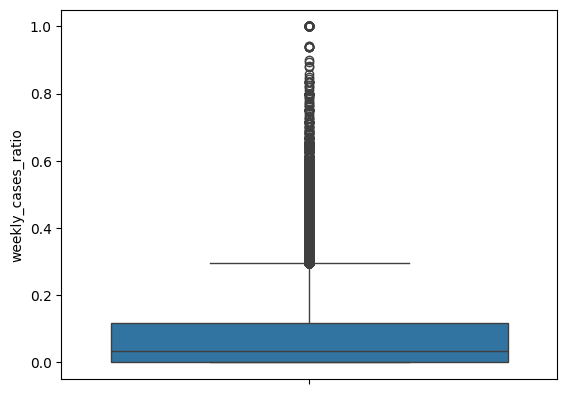

In [18]:
sns.boxplot(weekly_data_aggregated['weekly_cases_ratio'])

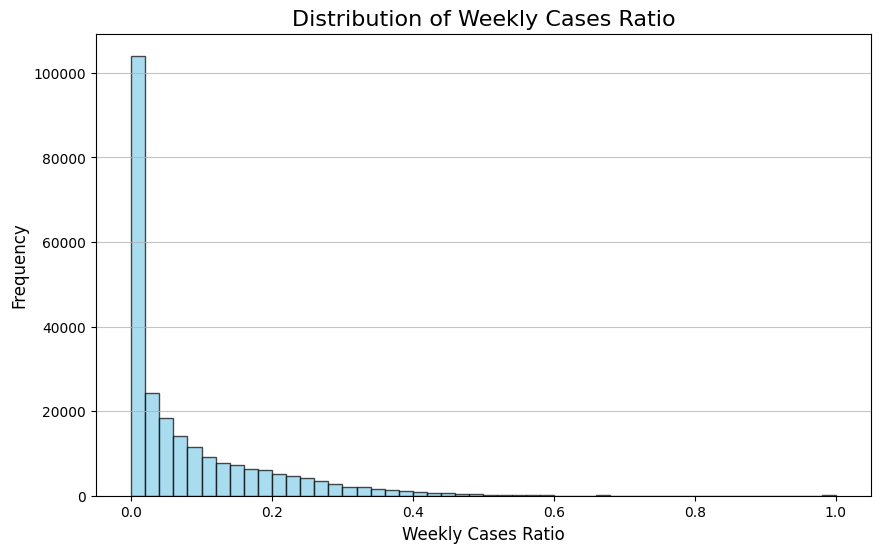

count    241323.000000
mean          0.078103
std           0.105484
min           0.000000
25%           0.000000
50%           0.032967
75%           0.117845
max           1.000000
Name: weekly_cases_ratio, dtype: float64

In [19]:
# Plot the distribution of `weekly_cases_ratio`
plt.figure(figsize=(10, 6))
weekly_data_aggregated['weekly_cases_ratio'].plot(kind='hist', bins=50, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Distribution of Weekly Cases Ratio', fontsize=16)
plt.xlabel('Weekly Cases Ratio', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', alpha=0.75)
plt.show()

# Describe the data
weekly_cases_ratio_desc = weekly_data_aggregated['weekly_cases_ratio'].describe()

# Output descriptive statistics
weekly_cases_ratio_desc


### Defining the Target Column

The **Weekly Confirmed Cases Ratio** (`weekly_cases_ratio`) will be defined as the **target column**. It will be mapped into three main categories to determine the **outbreak zones** of the virus:

its categorization motivated by the following statistical summary of the data:

**weekly_data_aggregated[`'weekly_cases_ratio'`].describe()**

The categorization creates three main groups:

**No Cases (0):** Represents areas with zero confirmed cases.

**Low Cases (1):** Represents areas with a positivity rate up to 11% (approximately the 75th percentile).

**High Cases (2):** Represents areas with a positivity rate above 11%.

This classification aids in identifying areas with varying levels of COVID-19 outbreaks, supporting focused analysis and resource allocation.



In [20]:
# הגדרת הפונקציה לסיווג קטגוריות
def categorize_cases_ratio(x):
    if x == 0:
        return 0  # No Cases
    elif 0 < x <= 0.11:  # חציון
        return 1  # Low Cases
    else:  # x > 0.11
        return 2  # High Cases

# יצירת עמודת קטגוריות
weekly_data_aggregated['target_category'] = weekly_data_aggregated['weekly_cases_ratio'].apply(categorize_cases_ratio)

In [21]:
# בדיקת החלוקה לקטגוריות
print(weekly_data_aggregated['target_category'].value_counts())

target_category
1    100417
0     76754
2     64152
Name: count, dtype: int64


### Addressing Imbalanced Ranges in Target Categories

There is an **imbalance in the distribution of the target categories**, which was expected. This is due to the fact that most tests are anticipated to be negative, and COVID-19 outbreaks in Israel over the past three years have not shown a consistent upward trend of surges (as verified through online research).

Given this imbalance, we will consider implementing **weighted calculations** for each category to balance their impact in the analysis and modeling phase. This adjustment would ensure that less frequent categories, such as areas with high outbreak rates, are not overshadowed by the dominant low-case categories.


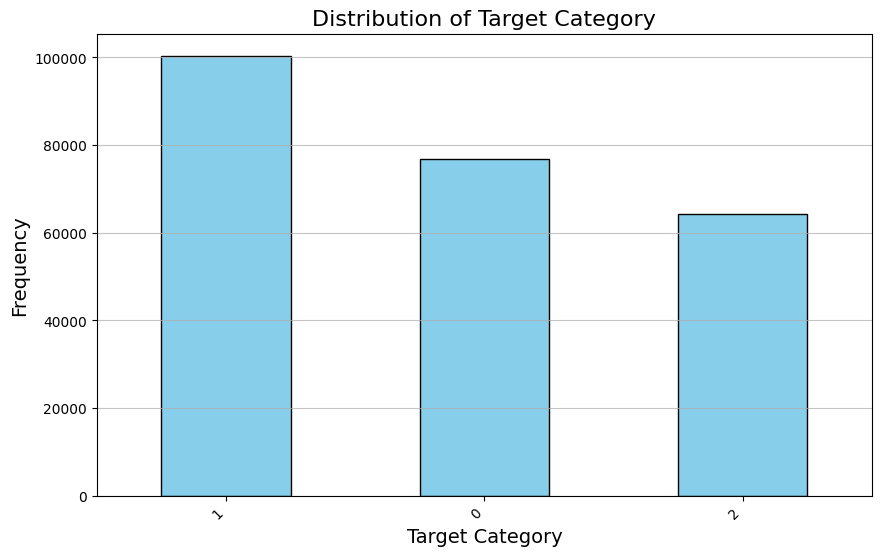

target_category
1    100417
0     76754
2     64152
Name: count, dtype: int64

In [22]:
### CODE BY GPT###

# Analyzing the distribution of `target_category`
target_category_distribution = weekly_data_aggregated['target_category'].value_counts()
# Plotting the distribution of `target_category`
plt.figure(figsize=(10, 6))
target_category_distribution.plot(kind='bar', color='skyblue', edgecolor='k')
plt.title('Distribution of Target Category', fontsize=16)
plt.xlabel('Target Category', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.75)
plt.show()

# Display the distribution counts
target_category_distribution
####

In [212]:
### CODE BY GPT###

# Calculating class weights
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Extract unique classes and their weights
classes = np.array(weekly_data_aggregated['target_category'].unique())  # Convert to numpy array
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=classes,
    y=weekly_data_aggregated['target_category']
)

# Map the weights to their corresponding classes
class_weights_dict = dict(zip(classes, class_weights))
#class_weights_dict = {0: 0.8, 1: 1.0, 2: 1.5}

# Display the class weights
class_weights
####
class_weights_dict

{np.int64(0): np.float64(1.0480365844125388),
 np.int64(1): np.float64(0.8010695400181245),
 np.int64(2): np.float64(1.2539125826162862)}

### Age Distribution Columns: Adults and Youth Ratios

To provide meaningful insights into the proportion of adults within a statistical area, we avoided using the absolute number of adults as it does not offer sufficient indication. 

Instead, the following columns represent the **ratios of adults and youth** relative to the total population in the respective statistical area. These ratios help in understanding the demographic composition and its potential impact on the analysis.


In [24]:
# Create the proportional columns
weekly_data_aggregated['p_over_60'] = weekly_data_aggregated['over_60'] / weekly_data_aggregated['total_population']
weekly_data_aggregated['p_under_60'] = weekly_data_aggregated['under_60'] / weekly_data_aggregated['total_population']

weekly_data_aggregated[['p_over_60', 'p_under_60']].describe().round()


,p_over_60,p_under_60
count,241323.0,241323.0
mean,0.0,1.0
std,0.0,0.0
min,0.0,0.0
25%,0.0,1.0
50%,0.0,1.0
75%,0.0,1.0
max,1.0,1.0


In [25]:
weekly_geo_df = weekly_data_aggregated.copy()

### Reducing the Town Code Column Categories

The **high number of categories** in the town code column may pose challenges for models in identifying meaningful relationships between categories. Reducing the number of categories can help simplify these relationships.

#### Motivation for Category Reduction:
1. **Handling Rare Categories**: Rare categories (e.g., those appearing only a few times) might be ignored by the models or assigned incorrect weights. Merging rare categories into broader groups can improve performance.
   
2. **Simplifying Relationships**: A large number of categories makes it harder for models to capture significant patterns. Reducing the categories can make these relationships more interpretable.

3. **Clustering and Dimensionality Reduction**: Techniques such as **clustering** or **PCA** can struggle to identify dominant patterns when there are too many categories. Consolidating categories can assist in recognizing principal patterns.

#### Approach:
We will merge rare categories into broader, logically defined groups to balance the representation of categories and improve model performance. This step will also aid in clustering and dimensionality reduction, helping us extract meaningful insights more effectively.


In [26]:
weekly_geo_df['style_code'].value_counts()

style_code
130    69269
160    41251
140    38669
150    34607
120    21756
190     6615
170     6043
250     4557
270     4315
180     4150
290     3234
280     3225
260     2603
191      640
193      147
192      147
310       95
Name: count, dtype: int64

In [27]:
# Define mapping for style_code
style_code_mapping = {
    120: 'Urban Large', 130: 'Urban Large',
    140: 'Urban Medium', 150: 'Urban Medium',
    160: 'Urban Small', 170: 'Urban Small', 180: 'Urban Small', 190: 'Urban Small',
    250: 'Non-Jewish Urban', 260: 'Non-Jewish Urban', 270: 'Non-Jewish Urban',
    280: 'Non-Jewish Urban', 290: 'Non-Jewish Urban',
    191: 'Rural', 192: 'Rural', 193: 'Rural', 310: 'Rural'
}

# Map the style_code to simplified categories
weekly_geo_df['simplified_style_code'] = weekly_geo_df['style_code'].map(style_code_mapping)

# Verify the distribution of the new categories
print(weekly_geo_df['simplified_style_code'].value_counts())


simplified_style_code
Urban Large         91025
Urban Medium        73276
Urban Small         58059
Non-Jewish Urban    17934
Rural                1029
Name: count, dtype: int64


### Handling Missing Coordinate Values

Missing coordinate values were filled by manually searching for the locations on **Google Maps**.

This approach was feasible since there were only 9 cities with missing coordinates, making manual lookup a practical and accurate solution.


In [28]:
# מילון עם קואורדינטות לערים חסרות
coordinates_dict = {
    'אבן יהודה': {'latitude': 32.2695, 'longitude': 34.8887},
    'ברכה': {'latitude': 32.2078, 'longitude': 35.2677},
    'טירה': {'latitude': 32.2289, 'longitude': 35.0593},
    'יבנאל': {'latitude': 32.6933, 'longitude': 35.5067},
    'לפיד': {'latitude': 31.9358, 'longitude': 34.9875},
    'ניצן': {'latitude': 31.7297, 'longitude': 34.6222},
    'סולם': {'latitude': 32.6048, 'longitude': 35.3783},
    'סלמה': {'latitude': 31.9433, 'longitude': 34.7922},
    'עמנואל': {'latitude': 32.1612, 'longitude': 35.1369}
}


In [29]:
# פונקציה לעדכון קואורדינטות לפי המילון
def update_coordinates(row):
    if pd.isnull(row['latitude']):
        town = row['town']
        if town in coordinates_dict:
            row['latitude'] = coordinates_dict[town]['latitude']
            row['longitude'] = coordinates_dict[town]['longitude']
    return row

# עדכון הערכים החסרים
weekly_geo_df = weekly_geo_df.apply(update_coordinates, axis=1)

# בדיקה לוודא שאין יותר ערכים חסרים
print(weekly_geo_df[['town', 'latitude', 'longitude']].isnull().sum())


town         0
latitude     0
longitude    0
dtype: int64


### Avoiding Perfectly Correlated Features

To ensure the reliability and efficiency of the model, we will be cautious of **perfectly correlated features**. Columns with perfect or near-perfect correlation will be identified and removed as part of the preprocessing step. This is important to avoid redundancy and prevent the model from being biased or overfitted due to redundant information.


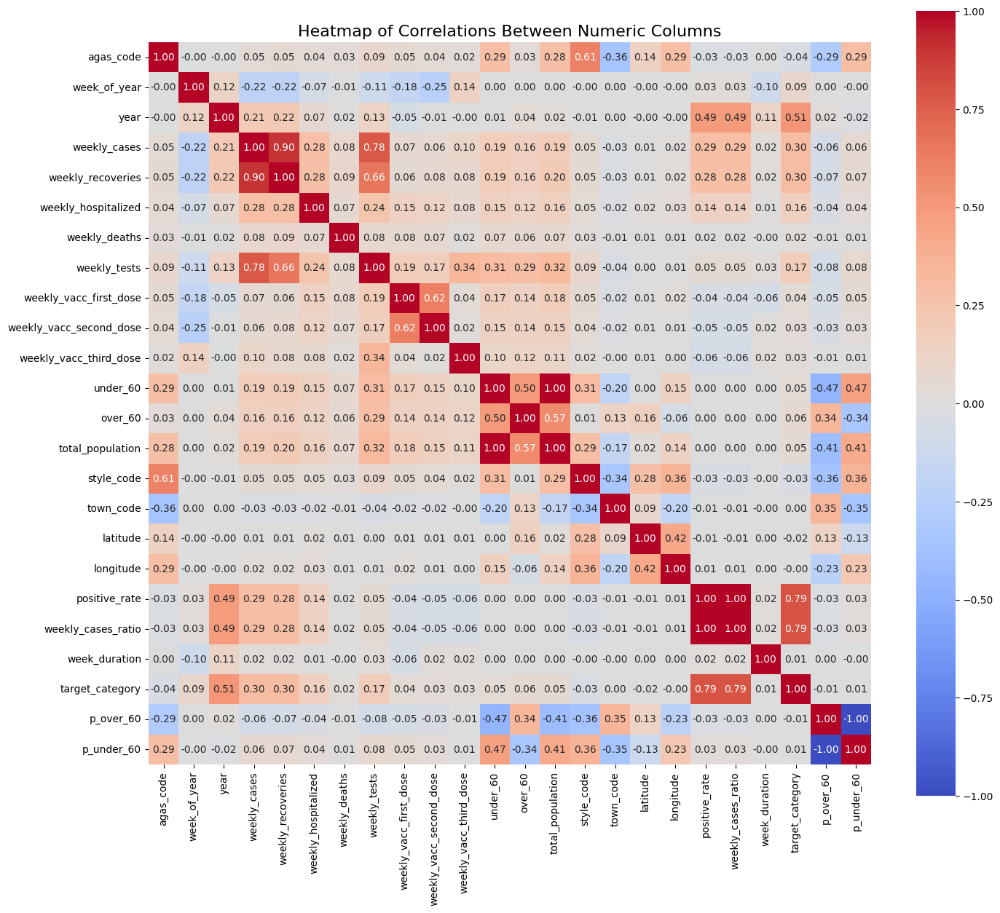

In [30]:
# Select only numeric columns
numeric_columns = weekly_geo_df.select_dtypes(include=['float64', 'int64','int32'])

# Calculate the correlation matrix
correlation_matrix = numeric_columns.corr()

# Create a heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, square=True)
plt.title("Heatmap of Correlations Between Numeric Columns", fontsize=16)
plt.show()


### Handling Categorical Columns

As observed, there are two columns with a large number of categories, which could pose challenges for our models. To address this issue, we will:

1. **Combine Statistical Area and Town Code**: 
   - We will merge the combinations of the **statistical area** and **town code** into a single column. This step simplifies the dataset and reduces the complexity associated with multiple categorical variables.

2. **Efficient Encoding**:
   - The combined column will be encoded in a way that does not negatively impact the models or increase runtime.

This approach ensures that the categorical data is represented effectively, minimizing the impact on both model accuracy and computational resources.


In [31]:
### CODE BY GPT###

# Checking the number of unique values in the categorical columns
unique_values = {
    'agas_code': weekly_geo_df['agas_code'].nunique(),
    'town_code': weekly_geo_df['town_code'].nunique(),
    'style_code': weekly_geo_df['style_code'].nunique()
}

# Display unique values count for each column
unique_values
####

{'agas_code': 338, 'town_code': 259, 'style_code': 17}

In [32]:
### CODE BY GPT###

# Creating a unique key by combining `town_code` and `agas_code`
weekly_geo_df['unique_geo_key'] = weekly_geo_df['town_code'].astype(str) + '_' + weekly_geo_df['agas_code'].astype(str)

# Checking the first few rows of the new column
unique_geo_key_sample = weekly_geo_df[['town_code', 'agas_code', 'unique_geo_key']].head()

# Checking the number of unique keys created
unique_geo_key_count = weekly_geo_df['unique_geo_key'].nunique()

# Display results
unique_geo_key_sample, unique_geo_key_count
####

(   town_code  agas_code unique_geo_key
 0        472       9999       472_9999
 1        472       9999       472_9999
 2        472       9999       472_9999
 3        472       9999       472_9999
 4        472       9999       472_9999,
 1644)

---
### Exploring Seasonality and Trends

In the following graph, we aim to examine whether there is evidence of **seasonality** or **trends** in any of the weekly columns. 

This analysis helps identify recurring patterns or directional changes over time, which could provide valuable insights for understanding the dynamics of the data.


In [33]:
### CODE BY GPT###

# Create a continuous time column representing the number of weeks since the start of the data
min_date = weekly_geo_df['start_date'].min()
weekly_geo_df['weeks_since_start'] = (weekly_geo_df['start_date'] - min_date).dt.days // 7
####

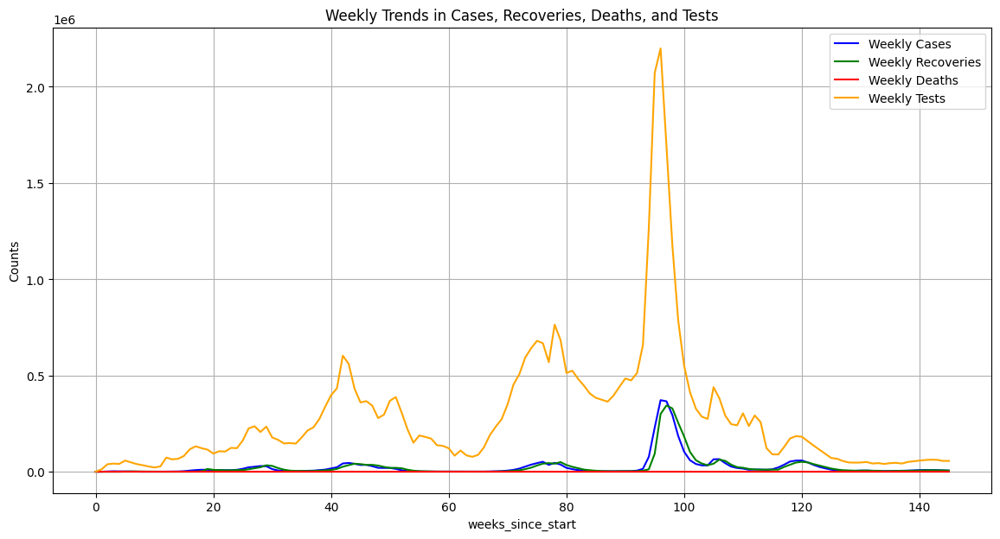

In [330]:
### CODE BY GPT###

# Convert date columns to datetime format for analysis
weekly_geo_df['start_date'] = pd.to_datetime(weekly_geo_df['start_date'])
weekly_geo_df['end_date'] = pd.to_datetime(weekly_geo_df['end_date'])

# Aggregate the data to analyze trends
weekly_trend = weekly_geo_df.groupby('weeks_since_start').agg(
    weekly_cases=('weekly_cases', 'sum'),
    weekly_recoveries=('weekly_recoveries', 'sum'),
    weekly_deaths=('weekly_deaths', 'sum'),
    weekly_tests=('weekly_tests', 'sum')
).reset_index()

# Display the trends visually to detect seasonality or patterns
# Weekly cases trend
plt.figure(figsize=(14, 7))
plt.plot(weekly_trend['weeks_since_start'], weekly_trend['weekly_cases'], label='Weekly Cases', color='blue')
plt.plot(weekly_trend['weeks_since_start'], weekly_trend['weekly_recoveries'], label='Weekly Recoveries', color='green')
plt.plot(weekly_trend['weeks_since_start'], weekly_trend['weekly_deaths'], label='Weekly Deaths', color='red')
plt.plot(weekly_trend['weeks_since_start'], weekly_trend['weekly_tests'], label='Weekly Tests', color='orange')
plt.legend()
plt.title('Weekly Trends in Cases, Recoveries, Deaths, and Tests')
plt.xlabel('weeks_since_start')
plt.ylabel('Counts')
plt.grid(True)
plt.show()
####

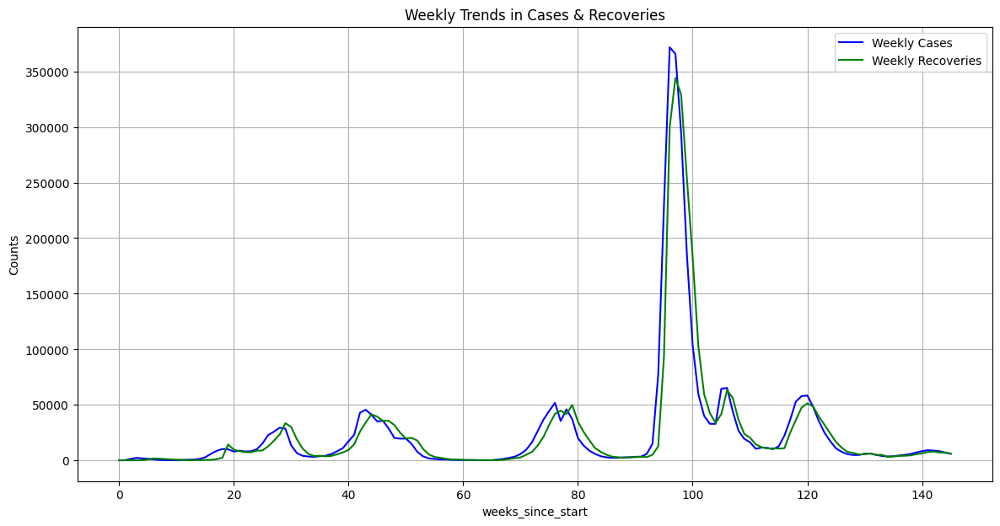

In [334]:
### CODE BY GPT###

# Convert date columns to datetime format for analysis
weekly_geo_df['start_date'] = pd.to_datetime(weekly_geo_df['start_date'])
weekly_geo_df['end_date'] = pd.to_datetime(weekly_geo_df['end_date'])

# Aggregate the data to analyze trends
weekly_trend = weekly_geo_df.groupby('weeks_since_start').agg(
    weekly_cases=('weekly_cases', 'sum'),
    weekly_recoveries=('weekly_recoveries', 'sum'),
).reset_index()

# Display the trends visually to detect seasonality or patterns
# Weekly cases trend
plt.figure(figsize=(14, 7))
plt.plot(weekly_trend['weeks_since_start'], weekly_trend['weekly_cases'], label='Weekly Cases', color='blue')
plt.plot(weekly_trend['weeks_since_start'], weekly_trend['weekly_recoveries'], label='Weekly Recoveries', color='green')
plt.legend()
plt.title('Weekly Trends in Cases & Recoveries')
plt.xlabel('weeks_since_start')
plt.ylabel('Counts')
plt.grid(True)
plt.show()
####

In [35]:
weekly_geo_df.columns

Index(['town', 'agas_code', 'week_of_year', 'year', 'start_date', 'end_date',
       'weekly_cases', 'weekly_recoveries', 'weekly_hospitalized',
       'weekly_deaths', 'weekly_tests', 'weekly_vacc_first_dose',
       'weekly_vacc_second_dose', 'weekly_vacc_third_dose', 'under_60',
       'over_60', 'total_population', 'style_code', 'town_code', 'latitude',
       'longitude', 'positive_rate', 'weekly_cases_ratio', 'week_duration',
       'target_category', 'p_over_60', 'p_under_60', 'simplified_style_code',
       'unique_geo_key', 'weeks_since_start'],
      dtype='object')

In [36]:
import warnings
warnings.filterwarnings('ignore')
# Add a small constant to prevent division by zero
epsilon = 1e-10

# Recalculate the weekly change, avoiding division by zero
weekly_geo_df['weekly_cases_change'] = (
    weekly_geo_df.groupby(['unique_geo_key', 'year'], group_keys=False)
    .apply(lambda group: group.sort_values('weeks_since_start')['weekly_cases']
           .diff() / (group.sort_values('weeks_since_start')['weekly_cases'].shift(1)) + epsilon)
    .round(3)
)

# Replace inf and -inf with NaN, then fill with 0 or other logical value
weekly_geo_df['weekly_cases_change'].replace([float('inf'), -float('inf')], 0, inplace=True)

# Fill NaN values if any remain
weekly_geo_df['weekly_cases_change'].fillna(0, inplace=True)

In [37]:
weekly_geo_df['weekly_cases_change'].describe()

count    241323.000000
mean          0.138523
std           1.214550
min          -1.000000
25%          -0.333000
50%           0.000000
75%           0.000000
max         118.000000
Name: weekly_cases_change, dtype: float64

<Axes: ylabel='weekly_cases_change'>

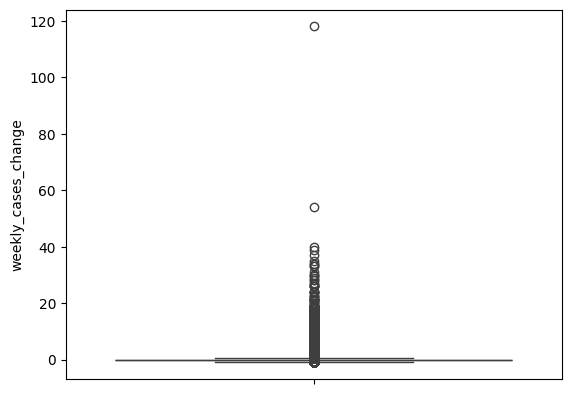

In [38]:
sns.boxplot(weekly_geo_df['weekly_cases_change'])

In [39]:
coordinates_df_url = 'https://raw.githubusercontent.com/Razelbaz1/Machine-Learning-Project/refs/heads/master/data/coordinates_df.csv'
coordinates_df = pd.read_csv(coordinates_df_url)

In [40]:
coordinates_df

,town,latitude,longitude
0,ראש פינה,32.969019,35.542859
1,מזכרת בתיה,31.850638,34.840016
2,אופקים,31.306754,34.619800
3,אליכין,32.407659,34.925028
4,כפר תבור,32.687727,35.420021
...,...,...,...
245,יהוד,32.031572,34.892571
246,קריית ביאליק,32.840840,35.091646
247,קריית ים,32.851004,35.070244
248,הוד השרון,32.149961,34.883879


In [335]:
weekly_fig = weekly_geo_df.groupby('town').agg(
    weekly_cases=('weekly_cases', 'sum'),
    weekly_recoveries=('weekly_recoveries', 'sum'),
    weekly_deaths=('weekly_deaths', 'sum'),
    weekly_tests=('weekly_tests', 'sum'),
    latitude=('latitude', 'first'),  # Add style_code
    longitude=('longitude', 'first')  # Add town_code
).reset_index()

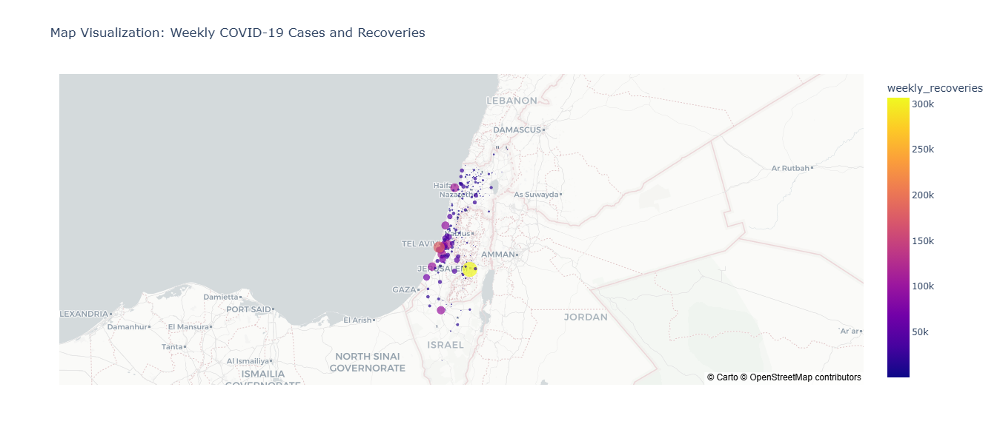

In [336]:
### CODE BY GPT###
fig = px.scatter_mapbox(
    weekly_fig,
    lat='latitude',
    lon='longitude',
    size_max=15,
    text='town', 
    size='weekly_cases',  
    color='weekly_recoveries',  
    zoom=6,
    height=600,
    mapbox_style="carto-positron",
    title="Map Visualization: Weekly COVID-19 Cases and Recoveries"
)

fig.show()
####

### Map Visualization: Weekly COVID-19 Cases and Recoveries

This map visualizes the distribution of **weekly COVID-19 cases and recoveries** across various cities in Israel. Each point on the map represents a city, with the following attributes:

- **Size of the points**: Reflects the number of weekly cases (`weekly_cases`), indicating the relative severity of the outbreak in each city.
- **Color of the points**: Corresponds to the number of weekly recoveries (`weekly_recoveries`), providing a sense of the recovery trends in the population.
- **City names**: Displayed on hover for easy identification of locations.

This visualization highlights the geographic and demographic diversity within the dataset, showcasing the range of urban and rural areas where the research was conducted.

#### Potential for Further Exploration

This map is just the beginning. Additional visualizations can be created to identify trends and patterns, such as time-based changes in cases and recoveries or correlations between demographic features and infection rates.


In [43]:
### CODE BY GPT###

# Define a function to calculate VIF for a given set of columns
def calculate_vif(dataframe, columns_to_include):
    # Select the specified columns
    selected_data = dataframe[columns_to_include]
    
    # Add a constant column
    X = add_constant(selected_data)
    
    # Calculate VIF for each column
    vif_data = pd.DataFrame({
        'Variable': X.columns,
        'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    })
    
    return vif_data

# Example of running the function (replace `selected_columns` with your choice of columns)
selected_columns = ['agas_code', 'weekly_recoveries', 'weekly_hospitalized',
       'weekly_deaths', 'weekly_tests', 'weekly_vacc_first_dose',
       'weekly_vacc_second_dose', 'town_code','style_code', 'weekly_vacc_third_dose',
       'total_population', 'weekly_cases_ratio', 'p_over_60','weeks_since_start','latitude' ,'longitude']
vif_results = calculate_vif(weekly_geo_df, selected_columns)


vif_results.round(2)
####

,Variable,VIF
0,const,31352.23
1,agas_code,1.71
2,weekly_recoveries,2.17
3,weekly_hospitalized,1.13
4,weekly_deaths,1.02
5,weekly_tests,2.40
6,weekly_vacc_first_dose,1.70
7,weekly_vacc_second_dose,1.66
8,town_code,1.29
9,style_code,1.93


In [44]:
weekly_geo_df.columns

Index(['town', 'agas_code', 'week_of_year', 'year', 'start_date', 'end_date',
       'weekly_cases', 'weekly_recoveries', 'weekly_hospitalized',
       'weekly_deaths', 'weekly_tests', 'weekly_vacc_first_dose',
       'weekly_vacc_second_dose', 'weekly_vacc_third_dose', 'under_60',
       'over_60', 'total_population', 'style_code', 'town_code', 'latitude',
       'longitude', 'positive_rate', 'weekly_cases_ratio', 'week_duration',
       'target_category', 'p_over_60', 'p_under_60', 'simplified_style_code',
       'unique_geo_key', 'weeks_since_start', 'weekly_cases_change'],
      dtype='object')

In [45]:
# Define the columns to drop based on VIF analysis
columns_to_drop = ['unique_geo_key','style_code','weekly_cases_ratio','positive_rate','town', 'start_date', 'end_date', 'under_60', 'over_60', 'p_under_60','weekly_cases','year','week_of_year','town_code','agas_code','week_duration']

# Drop the unwanted columns and keep the rest for PCA and classification
prepared_data = weekly_geo_df.drop(columns=columns_to_drop, errors='ignore')


In [46]:
prepared_data.columns

Index(['weekly_recoveries', 'weekly_hospitalized', 'weekly_deaths',
       'weekly_tests', 'weekly_vacc_first_dose', 'weekly_vacc_second_dose',
       'weekly_vacc_third_dose', 'total_population', 'latitude', 'longitude',
       'target_category', 'p_over_60', 'simplified_style_code',
       'weeks_since_start', 'weekly_cases_change'],
      dtype='object')

In [47]:
prepared_data['simplified_style_code'] = prepared_data['simplified_style_code'].astype('category')
prepared_data['target_category'] = prepared_data['target_category'].astype('category')
prepared_data['weekly_cases_change'] = prepared_data['weekly_cases_change'].astype('float')

In [48]:
prepared_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241323 entries, 0 to 241322
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype   
---  ------                   --------------   -----   
 0   weekly_recoveries        241323 non-null  int64   
 1   weekly_hospitalized      241323 non-null  int64   
 2   weekly_deaths            241323 non-null  int64   
 3   weekly_tests             241323 non-null  int64   
 4   weekly_vacc_first_dose   241323 non-null  int64   
 5   weekly_vacc_second_dose  241323 non-null  int64   
 6   weekly_vacc_third_dose   241323 non-null  int64   
 7   total_population         241323 non-null  float64 
 8   latitude                 241323 non-null  float64 
 9   longitude                241323 non-null  float64 
 10  target_category          241323 non-null  category
 11  p_over_60                241323 non-null  float64 
 12  simplified_style_code    241323 non-null  category
 13  weeks_since_start        241323 non-null  in

In [115]:
prepared_data = prepared_data.sort_values(by=['weeks_since_start'])


Performing Time Series Split Cross-Validation for Logistic Regression...
Logistic Regression Mean Time Series CV Accuracy: 0.6003
Logistic Regression Std Time Series CV Accuracy: 0.1476
Logistic Regression Training Accuracy: 0.7888
Logistic Regression Test Accuracy: 0.5772
Classification Report:
               precision    recall  f1-score   support

    No Cases       0.36      0.98      0.53      6106
         Low       0.33      0.42      0.37     10771
        High       0.96      0.55      0.70     31388

    accuracy                           0.58     48265
   macro avg       0.55      0.65      0.53     48265
weighted avg       0.74      0.58      0.61     48265

Confusion Matrix:
 [[ 5990   104    12]
 [ 5523  4518   730]
 [ 5130  8909 17349]]

Performing Time Series Split Cross-Validation for Decision Tree...
Decision Tree Mean Time Series CV Accuracy: 0.7568
Decision Tree Std Time Series CV Accuracy: 0.0208
Decision Tree Training Accuracy: 0.8771
Decision Tree Test Accuracy:

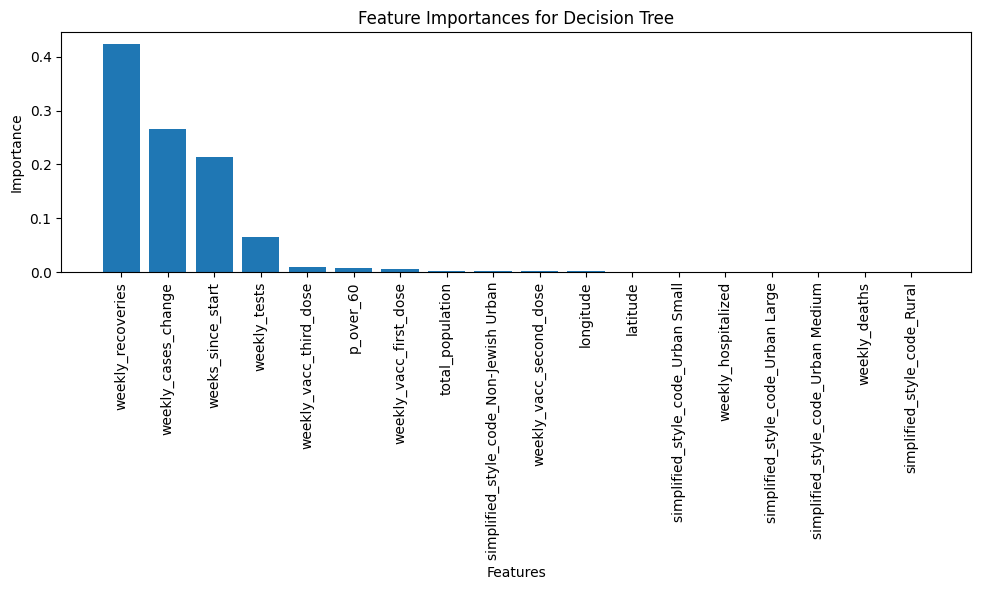


Performing Time Series Split Cross-Validation for Random Forest...
Random Forest Mean Time Series CV Accuracy: 0.7382
Random Forest Std Time Series CV Accuracy: 0.0479
Random Forest Training Accuracy: 0.8792
Random Forest Test Accuracy: 0.8219
Classification Report:
               precision    recall  f1-score   support

    No Cases       0.73      0.91      0.81      6106
         Low       0.82      0.46      0.59     10771
        High       0.84      0.93      0.88     31388

    accuracy                           0.82     48265
   macro avg       0.80      0.77      0.76     48265
weighted avg       0.82      0.82      0.81     48265

Confusion Matrix:
 [[ 5558    75   473]
 [  772  4974  5025]
 [ 1267   986 29135]]


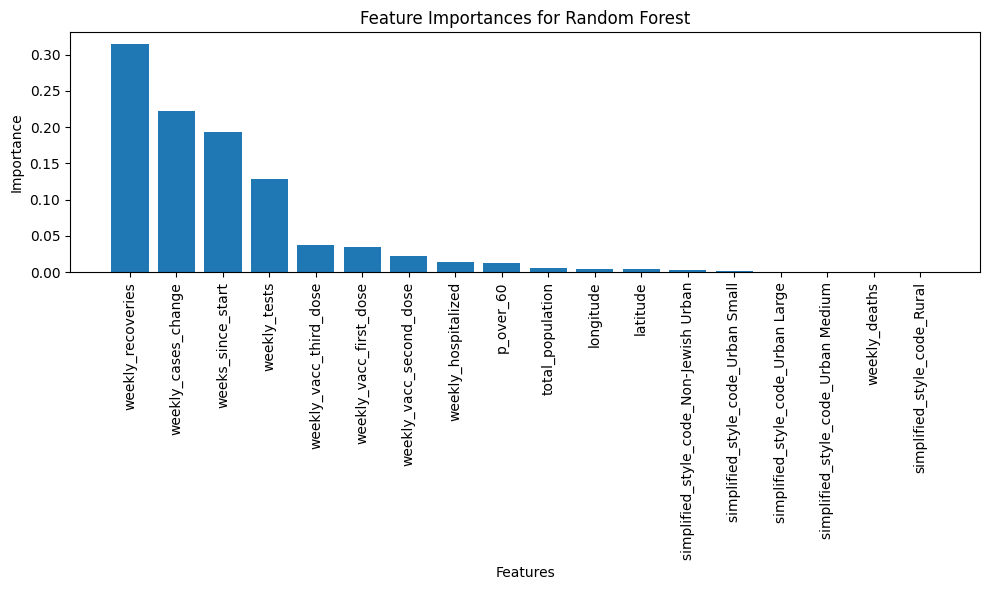


Performing Time Series Split Cross-Validation for XGBoost...
XGBoost Mean Time Series CV Accuracy: 0.7682
XGBoost Std Time Series CV Accuracy: 0.0632
XGBoost Training Accuracy: 0.8914
XGBoost Test Accuracy: 0.8403
Classification Report:
               precision    recall  f1-score   support

    No Cases       0.82      0.88      0.85      6106
         Low       0.88      0.49      0.63     10771
        High       0.84      0.95      0.89     31388

    accuracy                           0.84     48265
   macro avg       0.85      0.77      0.79     48265
weighted avg       0.84      0.84      0.83     48265

Confusion Matrix:
 [[ 5346    92   668]
 [  313  5302  5156]
 [  839   638 29911]]


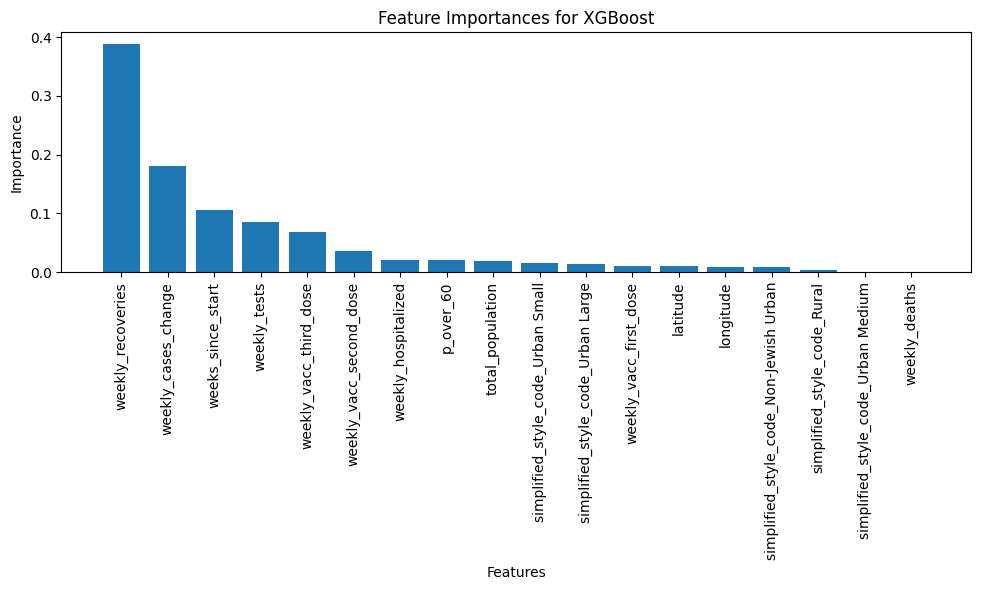


Time Series Cross-Validation Results:
Logistic Regression: Mean Accuracy = 0.6003, Std = 0.1476, Train Accuracy = 0.7888, Test Accuracy = 0.5772
Decision Tree: Mean Accuracy = 0.7568, Std = 0.0208, Train Accuracy = 0.8771, Test Accuracy = 0.8243
Random Forest: Mean Accuracy = 0.7382, Std = 0.0479, Train Accuracy = 0.8792, Test Accuracy = 0.8219
XGBoost: Mean Accuracy = 0.7682, Std = 0.0632, Train Accuracy = 0.8914, Test Accuracy = 0.8403


In [213]:
### CODE BY GPT###

# Define categorical and numerical columns
categorical_cols = ['simplified_style_code']
numerical_cols = [
    'weekly_recoveries', 'weekly_hospitalized', 'weekly_deaths', 
    'weekly_tests', 'weekly_vacc_first_dose', 'weekly_vacc_second_dose', 
    'weekly_vacc_third_dose', 'total_population', 'p_over_60', 'weeks_since_start','weekly_cases_change','longitude', 'latitude'
]

# Separate features and target
X = prepared_data.drop(columns=['target_category'])
y = prepared_data['target_category']

# Initialize LabelEncoder for `unique_geo_key`
#label_encoder = LabelEncoder()
#X['unique_geo_key_encoded'] = label_encoder.fit_transform(prepared_data['unique_geo_key'])

# Add `unique_geo_key_encoded` to numerical columns
#numerical_cols.append('unique_geo_key_encoded')

# Define the preprocessing pipeline
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Define models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42, C = 10, solver ='lbfgs', class_weight= class_weights_dict),
    'Decision Tree': DecisionTreeClassifier(random_state=42, max_depth= 10,min_samples_leaf =2, min_samples_split =2 ,class_weight= class_weights_dict ),
    'Random Forest': RandomForestClassifier(random_state=42, n_estimators=100, max_depth = 10,min_samples_split =5,class_weight= class_weights_dict  ),
    'XGBoost': XGBClassifier(random_state=42, n_estimators=100, use_label_encoder=False, eval_metric='mlogloss',learning_rate =  0.3, max_depth = 3)
    
}

# Custom chronological split: 80% for training (past), 20% for testing (future)
split_index = int(0.8 * len(X))
X_train, X_test = X.iloc[:split_index], X.iloc[split_index:]
y_train, y_test = y.iloc[:split_index], y.iloc[split_index:]

# TimeSeriesSplit setup
tscv = TimeSeriesSplit(n_splits=5)

# Store ROC data for each model
roc_data = {}


# Function to plot feature importances
def plot_feature_importance(importances, feature_names, model_name):
    # Sort features by importance
    sorted_idx = np.argsort(importances)[::-1]
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(importances)), importances[sorted_idx], align="center")
    plt.xticks(range(len(importances)), np.array(feature_names)[sorted_idx], rotation=90)
    plt.title(f"Feature Importances for {model_name}")
    plt.xlabel("Features")
    plt.ylabel("Importance")
    plt.tight_layout()
    plt.show()
    
# Iterate through models and evaluate with TimeSeriesSplit
results = {}
for model_name, model in models.items():
    print(f"\nPerforming Time Series Split Cross-Validation for {model_name}...")

    # Define pipeline
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])

    # Time Series Cross-Validation scores
    cv_scores = cross_val_score(pipeline, X, y, cv=tscv, scoring='accuracy')

    # Fit the pipeline on the training set
    pipeline.fit(X_train, y_train)

    # Predict on training and testing sets
    y_train_pred = pipeline.predict(X_train)
    y_test_pred = pipeline.predict(X_test)
    
    # Predict probabilities for ROC
    y_test_proba = pipeline.predict_proba(X_test)

    # Calculate ROC curve and AUC for each class
    fpr, tpr, roc_auc = {}, {}, {}
    for i, class_label in enumerate(np.unique(y)):
        fpr[class_label], tpr[class_label], _ = roc_curve(y_test == class_label, y_test_proba[:, i])
        roc_auc[class_label] = auc(fpr[class_label], tpr[class_label])

    # Store the results
    roc_data[model_name] = {'fpr': fpr, 'tpr': tpr, 'roc_auc': roc_auc}

    # Calculate accuracies
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)

    # Classification report and confusion matrix
    classification_rep = classification_report(y_test, y_test_pred, target_names=["No Cases", "Low", "High"])
    conf_matrix = confusion_matrix(y_test, y_test_pred)

    # Store results
    results[model_name] = {
        'cv_mean_accuracy': cv_scores.mean(),
        'cv_std_accuracy': cv_scores.std(),
        'train_accuracy': train_accuracy,
        'test_accuracy': test_accuracy,
        'classification_report': classification_rep,
        'confusion_matrix': conf_matrix
    }

    # Print results
    print(f"{model_name} Mean Time Series CV Accuracy: {cv_scores.mean():.4f}")
    print(f"{model_name} Std Time Series CV Accuracy: {cv_scores.std():.4f}")
    print(f"{model_name} Training Accuracy: {train_accuracy:.4f}")
    print(f"{model_name} Test Accuracy: {test_accuracy:.4f}")
    print("Classification Report:\n", classification_rep)
    print("Confusion Matrix:\n", conf_matrix)

        # Plot feature importances if supported by the model
    if model_name in ['Random Forest', 'Decision Tree', 'XGBoost']:
        classifier = pipeline.named_steps['classifier']
        if hasattr(classifier, 'feature_importances_'):
            feature_importances = classifier.feature_importances_
            plot_feature_importance(feature_importances, numerical_cols + list(preprocessor.named_transformers_['cat'].get_feature_names_out()), model_name)
        elif hasattr(classifier, 'coef_'):  # Logistic Regression
            feature_importances = np.abs(classifier.coef_[0])
            plot_feature_importance(feature_importances, numerical_cols + list(preprocessor.named_transformers_['cat'].get_feature_names_out()), model_name)


# Display all results
print("\nTime Series Cross-Validation Results:")
for model_name, result in results.items():
    print(f"{model_name}: Mean Accuracy = {result['cv_mean_accuracy']:.4f}, Std = {result['cv_std_accuracy']:.4f}, Train Accuracy = {result['train_accuracy']:.4f}, Test Accuracy = {result['test_accuracy']:.4f}")
####

In [125]:
from sklearn.model_selection import GridSearchCV

# פרמטרים לחיפוש
param_grids = {
    'Logistic Regression': {
        'classifier__C': [0.01, 0.1, 1, 10],
        'classifier__solver': ['lbfgs', 'liblinear']
    },
    'Decision Tree': {
        'classifier__max_depth': [3, 5, 7, 10,11,12],
        'classifier__min_samples_split': [2, 5, 10],
        'classifier__min_samples_leaf': [1, 2, 5]
    },
    'Random Forest': {
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [3, 5, 7, 10],
        'classifier__min_samples_split': [2, 5, 10]
    },
    'XGBoost': {
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [3, 5, 7],
        'classifier__learning_rate': [0.01, 0.1, 0.3]
    }
}


In [126]:
best_params = {}

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42, max_depth=7),
    'Random Forest': RandomForestClassifier(random_state=42, n_estimators=100, max_depth = 7),
    'XGBoost': XGBClassifier(random_state=42, n_estimators=100, use_label_encoder=False, eval_metric='mlogloss') 
}

for model_name, model in models.items():
    print(f"\nRunning Grid Search for {model_name}...")

    # Define pipeline
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])

    # Define Grid Search with Time Series Cross-Validation
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grids[model_name],
        cv=tscv,
        scoring='accuracy',
        verbose=1,
        n_jobs=-1
    )

    # Fit Grid Search
    grid_search.fit(X_train, y_train)

    # Save best parameters and best model
    best_params[model_name] = grid_search.best_params_
    models[model_name] = grid_search.best_estimator_

    # Print best parameters
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")



Running Grid Search for Logistic Regression...
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best parameters for Logistic Regression: {'classifier__C': 10, 'classifier__solver': 'lbfgs'}

Running Grid Search for Decision Tree...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for Decision Tree: {'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2}

Running Grid Search for Random Forest...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters for Random Forest: {'classifier__max_depth': 10, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 100}

Running Grid Search for XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters for XGBoost: {'classifier__learning_rate': 0.3, 'classifier__max_depth': 3, 'classifier__n_estimators': 100}


**This part of the code may not run because the RNN model results were processed in Google Collab.**

**The results were converted to a dictionary and merged with the results of the other models.**

**If you want to merge them as well - go to the GitHub link and download the file `roc_data_nn.pkl`**

In [122]:
import pickle

# טען את הקובץ מהמחשב
with open('roc_data_nn.pkl', 'rb') as file:
    roc_data_nn = pickle.load(file)

# בדיקה שהקובץ נטען בהצלחה
print(roc_data_nn.keys())


dict_keys(['Neural Network'])


In [123]:
roc_data_main = roc_data

# שילוב הנתונים מ-Colab עם הנתונים הקיימים
roc_data_main.update(roc_data_nn)

# בדיקה שהשילוב עבד
print(roc_data_main.keys())


dict_keys(['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'Neural Network'])


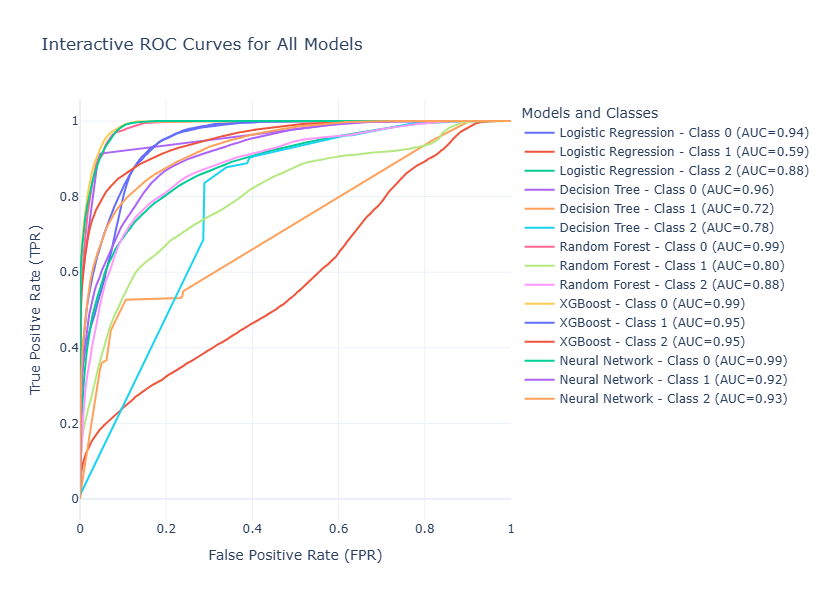

In [214]:
### CODE BY GPT###

# Plot ROC curves using Plotly
fig = go.Figure()

for model_name, data in roc_data_main.items():
    for class_label in np.unique(y):
        fig.add_trace(go.Scatter(
            x=data['fpr'][class_label],
            y=data['tpr'][class_label],
            mode='lines',
            name=f"{model_name} - Class {class_label} (AUC={data['roc_auc'][class_label]:.2f})",
            hovertemplate=(
                f"<b>{model_name} - Class {class_label}</b><br>"
                f"FPR: {{x:.2f}}<br>TPR: {{y:.2f}}<br>AUC: {data['roc_auc'][class_label]:.2f}"
            )
        ))

# Layout settings
fig.update_layout(
    title="Interactive ROC Curves for All Models",
    xaxis_title="False Positive Rate (FPR)",
    yaxis_title="True Positive Rate (TPR)",
    legend_title="Models and Classes",
    template="plotly_white",
    width=900,
    height=600
)

# Show the interactive plot
fig.show()
####

---

# **Chapter 3.**

<a class="anchor" id='sec2'></a>
<div style="color:white;display:fill;border-radius:25px;
            background-color:#99D8FF;font-size:150%;
            letter-spacing:1.0px;background-image: url">
    <p style="padding: 8px;text-align: center;color:#464646; border-radius: 10px; padding-top: 5px; padding-bottom: 5px;"><b><b><span style='color:#99D8FF''></span></b> Unsupervised Analysis. </b></p></div>

In [49]:
# Define the columns to drop based on VIF analysis
columns_to_drop = ['style_code','week_duration','positive_rate','target_category','town', 'start_date', 'end_date', 'under_60', 'over_60', 'p_under_60','weekly_cases','year','week_of_year','town_code','agas_code']

# Drop the unwanted columns and keep the rest for PCA and classification
unsup_prepared_data = weekly_geo_df.drop(columns=columns_to_drop, errors='ignore')

In [50]:
unsup_prepared_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241323 entries, 0 to 241322
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   weekly_recoveries        241323 non-null  int64  
 1   weekly_hospitalized      241323 non-null  int64  
 2   weekly_deaths            241323 non-null  int64  
 3   weekly_tests             241323 non-null  int64  
 4   weekly_vacc_first_dose   241323 non-null  int64  
 5   weekly_vacc_second_dose  241323 non-null  int64  
 6   weekly_vacc_third_dose   241323 non-null  int64  
 7   total_population         241323 non-null  float64
 8   latitude                 241323 non-null  float64
 9   longitude                241323 non-null  float64
 10  weekly_cases_ratio       241323 non-null  float64
 11  p_over_60                241323 non-null  float64
 12  simplified_style_code    241323 non-null  object 
 13  unique_geo_key           241323 non-null  object 
 14  week

In [51]:
# Sort the unsupervised analysis dataset by 'weeks_since_start' and then by 'week_of_year'
unsup_prepared_data = unsup_prepared_data.sort_values(by=['weeks_since_start'])

In [52]:
# Copy the data to avoid modifying the original DataFrame
unsup_data = unsup_prepared_data.copy()

# Step 1: Encode the categorical column ('unique_geo_key')
encoder = LabelEncoder()
unsup_data['unique_geo_key_encoded'] = encoder.fit_transform(unsup_data['unique_geo_key'])

# Step 2: One-Hot Encoding for 'simplified_style_code'
# Use pandas for simplicity
one_hot_encoded = pd.get_dummies(unsup_data['simplified_style_code'], prefix='style', dtype=int)
unsup_data = pd.concat([unsup_data, one_hot_encoded], axis=1)

# Step 3: Normalize numeric columns
# Select only numeric columns
numeric_cols = unsup_data.select_dtypes(include=['int64', 'float64']).columns
scaler = StandardScaler()
unsup_data[numeric_cols] = scaler.fit_transform(unsup_data[numeric_cols])

# Step 4: Drop the original categorical columns
unsup_data.drop(columns=['simplified_style_code','unique_geo_key'], inplace=True) # drop unique_geo_key

# Step 5: Verify data preparation
print(f"Shape of processed data: {unsup_data.shape}")
unsup_data.head()


Shape of processed data: (241323, 20)


,weekly_recoveries,weekly_hospitalized,weekly_deaths,weekly_tests,weekly_vacc_first_dose,weekly_vacc_second_dose,weekly_vacc_third_dose,total_population,latitude,longitude,weekly_cases_ratio,p_over_60,weeks_since_start,weekly_cases_change,unique_geo_key_encoded,style_Non-Jewish Urban,style_Rural,style_Urban Large,style_Urban Medium,style_Urban Small
194104,-0.305748,-0.211408,-0.029824,-0.530435,-0.261106,-0.247906,-0.229152,-0.101233,-0.283868,-0.708115,-0.740424,0.345154,-1.718346,-0.114053,1.113527,-0.28334,-0.065439,1.284980,-0.660337,-0.562855
147,-0.305748,-0.211408,-0.029824,-0.530435,-0.261106,-0.247906,-0.229152,1.923565,1.732344,1.026375,-0.740424,-1.015450,-1.718346,-0.114053,-0.394697,3.52933,-0.065439,-0.778222,-0.660337,-0.562855
102670,-0.305748,-0.211408,-0.029824,-0.530435,-0.261106,-0.247906,-0.229152,0.239507,-0.668890,1.222112,-0.740424,-0.642034,-1.718346,-0.114053,-0.750689,-0.28334,-0.065439,1.284980,-0.660337,-0.562855
111637,-0.305748,-0.211408,-0.029824,-0.530435,-0.261106,-0.247906,-0.229152,-0.556620,-0.668890,1.222112,-0.740424,-0.234339,-1.718346,-0.114053,-0.896034,-0.28334,-0.065439,1.284980,-0.660337,-0.562855
126484,-0.305748,-0.211408,-0.029824,-0.530435,-0.261106,-0.247906,-0.229152,-0.063017,-0.300150,-0.304897,-0.740424,0.000748,-1.718346,-0.114053,0.515293,-0.28334,-0.065439,-0.778222,1.514379,-0.562855


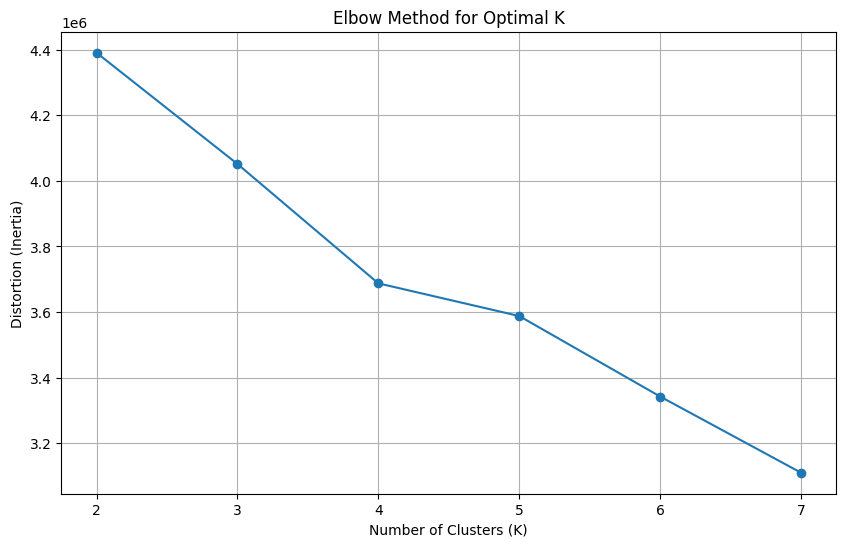

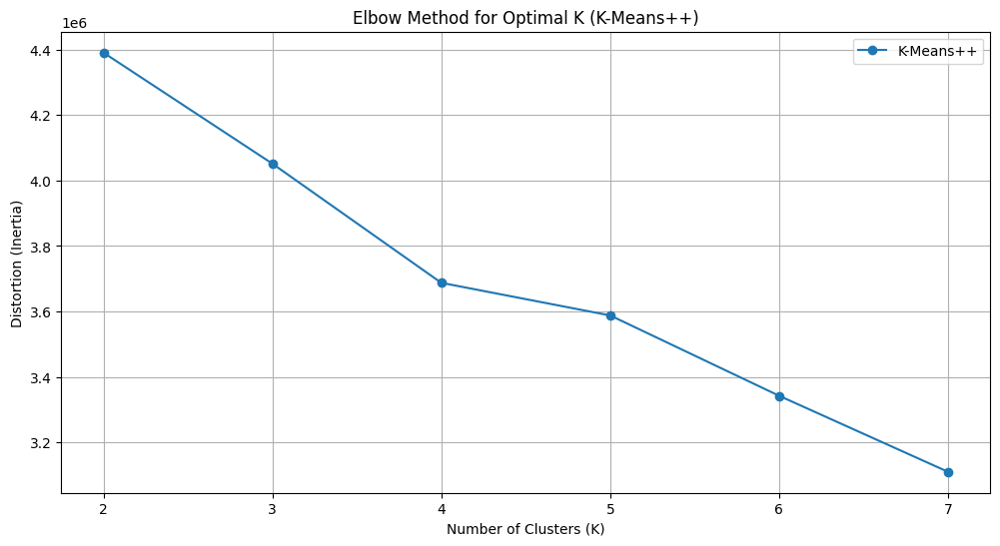

In [78]:
def optimize_clustering(data, max_clusters=10):
    distortions_kmeans_plus = []
    distortions_kmeans = []

    for k in range(2, max_clusters + 1):
        # K-Means++
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        kmeans_labels = kmeans.fit_predict(data)
        distortions_kmeans_plus.append(kmeans.inertia_)  # Inertia for Elbow Method

    
    for k in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(data)
        distortions_kmeans.append(kmeans.inertia_)  # Inertia for Elbow Method

    
    # Elbow Method
    plt.figure(figsize=(10, 6))
    plt.plot(range(2, max_clusters + 1), distortions_kmeans, marker='o', label='K-Means')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion (Inertia)')
    plt.grid(True)
    plt.show()
    
    # Elbow Method for K-Means++
    plt.figure(figsize=(12, 6))
    plt.plot(range(2, max_clusters + 1), distortions_kmeans_plus, marker='o', label='K-Means++')
    plt.title('Elbow Method for Optimal K (K-Means++)')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion (Inertia)')
    plt.grid(True)
    plt.legend()
    plt.show()

# Run the optimization
optimize_clustering(unsup_data, max_clusters=7)


N=2, BIC=-1458415.8829461196
N=3, BIC=-3843990.8382112063
N=4, BIC=-6786611.329820454
N=5, BIC=-8236868.547738986
N=6, BIC=-10576594.248484224
N=7, BIC=-10976957.302326089


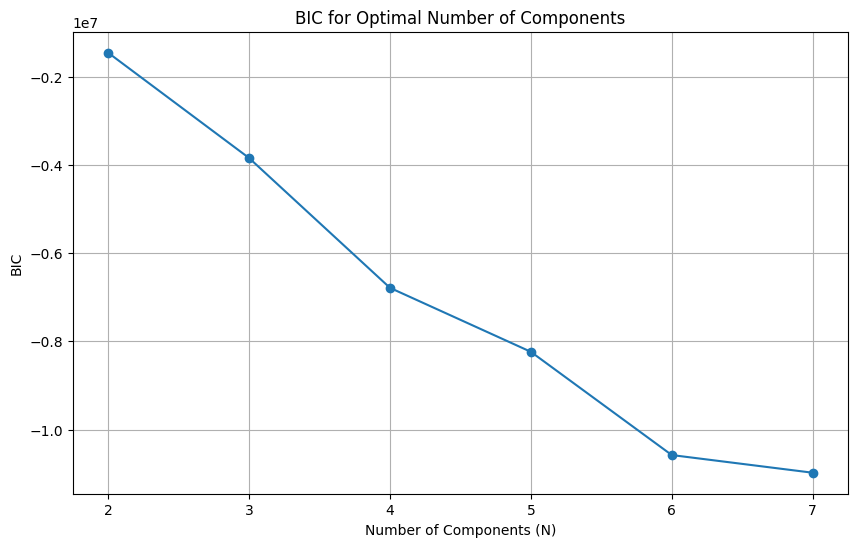

In [101]:
def optimize_gmm(data, max_clusters=10):
    bics = []

    for n in range(2, max_clusters + 1):
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm.fit(data)
        bic = gmm.bic(data)
        bics.append(bic)
        print(f"N={n}, BIC={bic}")

    # BIC Plot
    plt.figure(figsize=(10, 6))
    plt.plot(range(2, max_clusters + 1), bics, marker='o')
    plt.title('BIC for Optimal Number of Components')
    plt.xlabel('Number of Components (N)')
    plt.ylabel('BIC')
    plt.grid(True)
    plt.show()

# Run the optimization
optimize_gmm(unsup_data, max_clusters=7)


In [79]:
def GaussianMixture_silhouette(data, max_clusters):

    for n in range(2, max_clusters + 1):
        gmm = GaussianMixture(n_components=n, random_state=42)
        gmm_labels = gmm.fit_predict(data)
        gmm_silhouette = silhouette_score(data, gmm_labels)
        print(f"N={n}, silhouette_score={gmm_silhouette}")

result_opt = GaussianMixture_silhouette(unsup_data, max_clusters=6)


N=2, silhouette_score=0.2183334034262906
N=3, silhouette_score=0.12704672491056465
N=4, silhouette_score=0.18602707424581325
N=5, silhouette_score=0.2091281581781779
N=6, silhouette_score=0.13943618008631462


In [78]:
def optimize_dbscan(data, eps_values=[0.3, 0.5, 0.7], min_samples_values=[5, 10, 20]):
    best_score = -1
    best_params = {}

    for eps in eps_values:
        for min_samples in min_samples_values:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(data)
            if len(set(labels)) > 1:  # Ensure more than one cluster
                silhouette_avg = silhouette_score(data, labels)
                print(f"eps={eps}, min_samples={min_samples}, Silhouette Score={silhouette_avg}")
                if silhouette_avg > best_score:
                    best_score = silhouette_avg
                    best_params = {'eps': eps, 'min_samples': min_samples}

    print(f"Best DBSCAN params: {best_params}, Best Silhouette Score: {best_score}")
    return best_params

# Run the optimization
dbscan_params = optimize_dbscan(unsup_data, eps_values=[0.3, 0.5, 0.7, 0.9], min_samples_values=[5, 10, 20, 50, 100])


eps=0.3, min_samples=5, Silhouette Score=-0.39927603932679884
eps=0.3, min_samples=10, Silhouette Score=-0.40564634650360987
eps=0.3, min_samples=20, Silhouette Score=-0.4392706539502511
eps=0.3, min_samples=50, Silhouette Score=-0.4454235978524912
eps=0.3, min_samples=100, Silhouette Score=-0.4054527653835304
eps=0.5, min_samples=5, Silhouette Score=-0.40328114719833835
eps=0.5, min_samples=10, Silhouette Score=-0.3655033543524507
eps=0.5, min_samples=20, Silhouette Score=-0.3425718795141813
eps=0.5, min_samples=50, Silhouette Score=-0.3099730458052188
eps=0.5, min_samples=100, Silhouette Score=-0.3695297896548481
eps=0.7, min_samples=5, Silhouette Score=-0.3376747442381121
eps=0.7, min_samples=10, Silhouette Score=-0.3250939658175231
eps=0.7, min_samples=20, Silhouette Score=-0.28554467961563584
eps=0.7, min_samples=50, Silhouette Score=-0.22096607740860347
eps=0.7, min_samples=100, Silhouette Score=-0.225883103475345
eps=0.9, min_samples=5, Silhouette Score=-0.18395648813595356
eps=

# Model Selection with Optimal Parameters.

In [216]:
# Define function to run multiple iterations on a sample
def evaluate_models_sample(data, k_values, sample_frac=0.1, n_iterations=10):
    results = {"KMeans": [], "KMeans++": [], "GaussianMixture": []}
    
    # Sample a fraction of the data
    data_sample = data.sample(frac=sample_frac, random_state=42)

    for _ in range(n_iterations):
        # KMeans
        kmeans = KMeans(n_clusters=k_values["KMeans"], random_state=np.random.randint(1000))
        kmeans_labels = kmeans.fit_predict(data_sample)
        kmeans_score = silhouette_score(data_sample, kmeans_labels)
        results["KMeans"].append(kmeans_score)

        # KMeans++
        kmeans_plus = KMeans(n_clusters=k_values["KMeans++"], init='k-means++', random_state=np.random.randint(1000))
        kmeans_plus_labels = kmeans_plus.fit_predict(data_sample)
        kmeans_plus_score = silhouette_score(data_sample, kmeans_plus_labels)
        results["KMeans++"].append(kmeans_plus_score)

        # GaussianMixture
        gmm = GaussianMixture(n_components=k_values["GaussianMixture"], random_state=np.random.randint(1000))
        gmm_labels = gmm.fit_predict(data_sample)
        gmm_score = silhouette_score(data_sample, gmm_labels)
        results["GaussianMixture"].append(gmm_score)

    # Print results
    for model, scores in results.items():
        print(f"\n{model} Results:")
        print(f"Mean Silhouette Score: {np.mean(scores):.4f}")
        print(f"Standard Deviation: {np.std(scores):.4f}")
        print(f"Scores: {scores}")

    return results

# Define optimal K values for each model
optimal_k_values = {
    "KMeans": 4,
    "KMeans++": 4,
    "GaussianMixture": 2
}

# Run the evaluation
results_sample = evaluate_models_sample(unsup_data, optimal_k_values, sample_frac=0.2, n_iterations=10)



KMeans Results:
Mean Silhouette Score: 0.2195
Standard Deviation: 0.0292
Scores: [np.float64(0.23862462940163215), np.float64(0.23757739308833814), np.float64(0.23757739308833814), np.float64(0.19077150812091967), np.float64(0.23862462940163215), np.float64(0.17877153624365424), np.float64(0.23862462940163215), np.float64(0.2362205349879043), np.float64(0.23862462940163215), np.float64(0.15932909585913227)]

KMeans++ Results:
Mean Silhouette Score: 0.2191
Standard Deviation: 0.0321
Scores: [np.float64(0.2362205349879043), np.float64(0.19070017264622388), np.float64(0.23862462940163215), np.float64(0.23757739308833814), np.float64(0.23862462940163215), np.float64(0.2362205349879043), np.float64(0.2362205349879043), np.float64(0.20123189455499016), np.float64(0.13658666831782268), np.float64(0.23862462940163215)]

GaussianMixture Results:
Mean Silhouette Score: 0.3224
Standard Deviation: 0.2807
Scores: [np.float64(0.18184374054421265), np.float64(0.18123919493551363), np.float64(0.18313

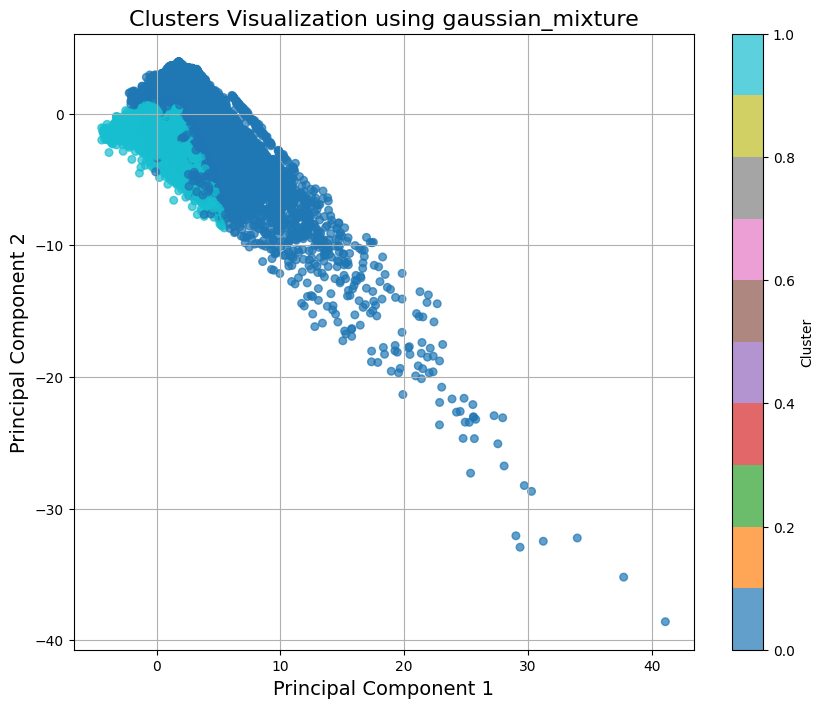

In [235]:
def visualize_clusters(data, n_clusters, method='kmeans++'):
    """
    Visualize clusters using PCA for dimensionality reduction.
    """
    # Step 1: Fit the clustering model
    if method == 'kmeans++':
        model = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
    elif method == 'gaussian_mixture':
        from sklearn.mixture import GaussianMixture
        model = GaussianMixture(n_components=n_clusters, random_state=42)
    else:
        raise ValueError("Unsupported method. Use 'kmeans++' or 'gaussian_mixture'.")

    labels = model.fit_predict(data)

    # Step 2: Apply PCA to reduce dimensions
    pca = PCA(n_components=2)
    pca_components = pca.fit_transform(data)

    # Step 3: Create the plot
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(pca_components[:, 0], pca_components[:, 1], c=labels, cmap='tab10', alpha=0.7, s=30)
    plt.colorbar(scatter, label='Cluster')
    plt.title(f"Clusters Visualization using {method}", fontsize=16)
    plt.xlabel("Principal Component 1", fontsize=14)
    plt.ylabel("Principal Component 2", fontsize=14)
    plt.grid(True)
    plt.show()

# Run the visualization for KMeans++
visualize_clusters(unsup_data, n_clusters=2, method='gaussian_mixture')


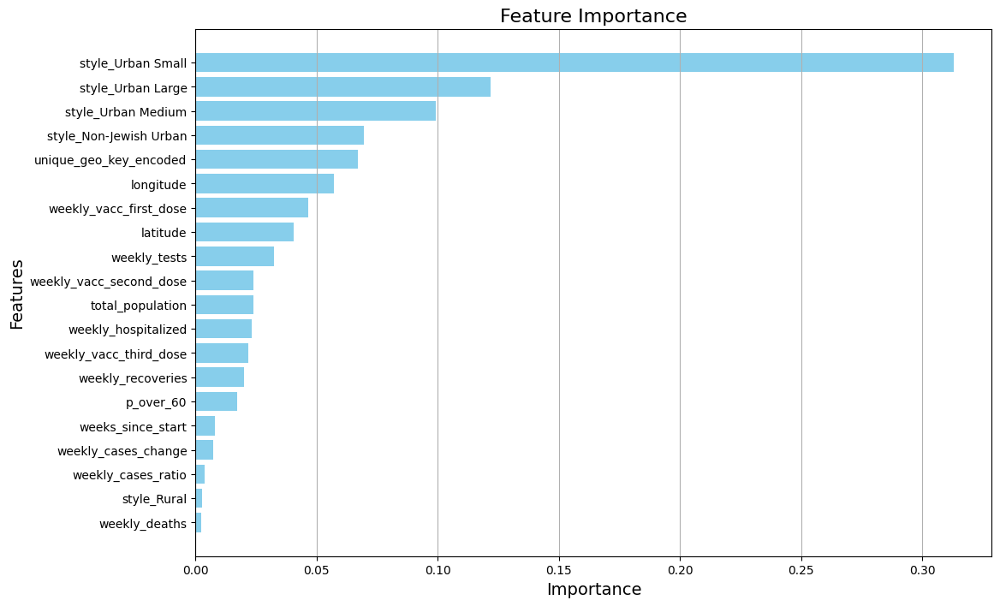

In [265]:
# שלב 1: הוספת עמודת קלאסטר
gmm = GaussianMixture(n_components=2, random_state=42)
unsup_data['cluster'] = gmm.fit_predict(unsup_data)

# שלב 2: חלוקת נתונים לפי כרונולוגיה
X = unsup_data.drop('cluster', axis=1)
y = unsup_data['cluster']

# שלב 3: אימון Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)


# שלב 5: Feature Importance
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# הצגת חשיבות מאפיינים
plt.figure(figsize=(12, 8))
plt.barh(feature_importances['Feature'], feature_importances['Importance'], color='skyblue')
plt.title("Feature Importance", fontsize=16)
plt.xlabel("Importance", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.gca().invert_yaxis()
plt.grid(axis='x')
plt.show()


In [266]:
unsup_prepared_data_cluster = unsup_prepared_data.copy()

unsup_prepared_data_cluster['cluster'] = unsup_data['cluster']

In [267]:
unsup_prepared_data_cluster.columns

Index(['weekly_recoveries', 'weekly_hospitalized', 'weekly_deaths',
       'weekly_tests', 'weekly_vacc_first_dose', 'weekly_vacc_second_dose',
       'weekly_vacc_third_dose', 'total_population', 'latitude', 'longitude',
       'weekly_cases_ratio', 'p_over_60', 'simplified_style_code',
       'unique_geo_key', 'weeks_since_start', 'weekly_cases_change',
       'cluster'],
      dtype='object')

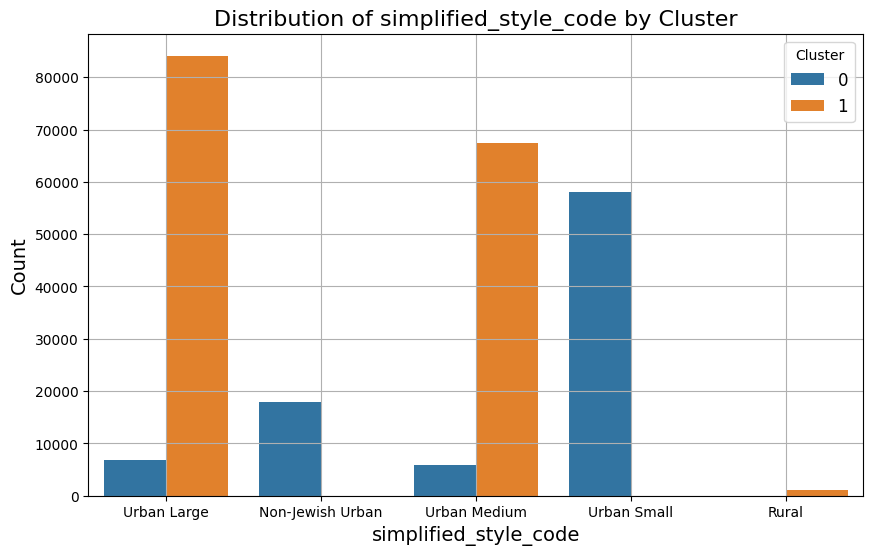

In [268]:
feature1 = ['simplified_style_code']

plt.figure(figsize=(10, 6))
sns.countplot(x=feature1[0], hue='cluster', data=unsup_prepared_data_cluster, palette='tab10')
plt.title(f"Distribution of {feature1[0]} by Cluster", fontsize=16)
plt.xlabel(feature1[0], fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.legend(title="Cluster", fontsize=12)
plt.grid(True)
plt.show()

In [308]:
# חישוב ממוצעים וסטיית תקן עבור עמודות רציפות לפי קלסטר
continuous_columns = ['weekly_recoveries', 'weekly_hospitalized', 'weekly_deaths',
       'weekly_tests', 'weekly_vacc_first_dose', 'weekly_vacc_second_dose',
       'weekly_vacc_third_dose', 'latitude', 'longitude',
       'weekly_cases_ratio', 'p_over_60','weeks_since_start', 'weekly_cases_change','total_population','weekly_tests'] # 

# חישוב ממוצעים
means_per_cluster = unsup_prepared_data_cluster.groupby('cluster')[continuous_columns].mean()

# חישוב סטיית תקן
std_per_cluster = unsup_prepared_data_cluster.groupby('cluster')[continuous_columns].std()

# הצגת הממוצעים בטבלה
print("Means per Cluster:")
display(means_per_cluster)

# הצגת סטיית התקן בטבלה
print("Standard Deviation per Cluster:")
display(std_per_cluster)


Means per Cluster:


,weekly_recoveries,weekly_hospitalized,weekly_deaths,weekly_tests,weekly_vacc_first_dose,weekly_vacc_second_dose,weekly_vacc_third_dose,latitude,longitude,weekly_cases_ratio,p_over_60,weeks_since_start,weekly_cases_change,total_population,weekly_tests
cluster,,,,,,,,,,,,,,,
0,23.434616,0.534356,0.025836,254.082193,40.413589,34.761530,23.342681,32.262113,35.056794,0.079026,0.165915,71.011353,0.228389,6762.455305,254.082193
1,9.463581,0.126360,0.000000,122.062039,9.606063,10.856574,8.750498,32.005198,34.892729,0.077565,0.212083,73.074306,0.086211,4442.621129,122.062039


Standard Deviation per Cluster:


,weekly_recoveries,weekly_hospitalized,weekly_deaths,weekly_tests,weekly_vacc_first_dose,weekly_vacc_second_dose,weekly_vacc_third_dose,latitude,longitude,weekly_cases_ratio,p_over_60,weeks_since_start,weekly_cases_change,total_population,weekly_tests
cluster,,,,,,,,,,,,,,,
0,73.647034,2.061442,0.525064,486.538272,124.879560,121.016976,91.321248,0.551791,0.243810,0.10514,0.086690,40.248266,1.565856,6708.931337,486.538272
1,19.505539,0.413472,0.000000,139.704234,27.379323,34.740052,32.767276,0.432267,0.165655,0.10568,0.082008,43.099096,0.948215,2555.323597,139.704234


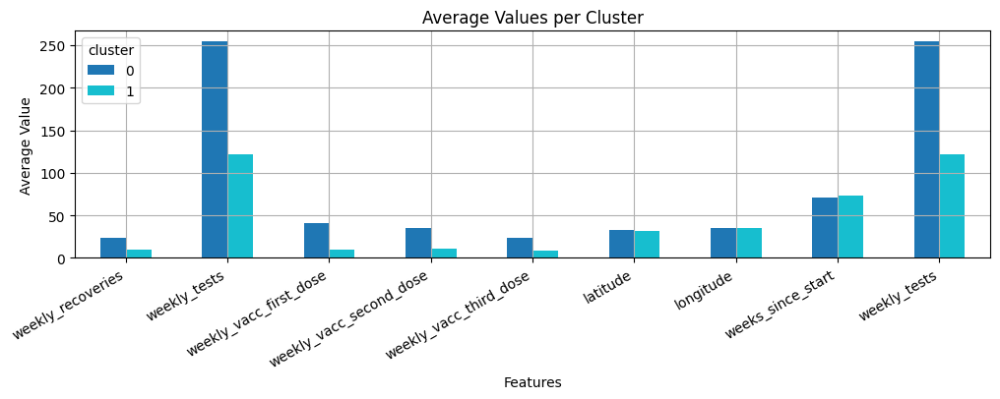

In [314]:
col = ['weekly_hospitalized', 'weekly_deaths',
       'weekly_cases_ratio', 'p_over_60','total_population','weekly_cases_change']

means_per_cluster.drop(columns = col).T.plot(kind='bar', figsize=(12, 3), title="Average Values per Cluster", colormap='tab10')
plt.xlabel("Features")
plt.ylabel("Average Value")
plt.xticks(rotation=30, ha='right')
plt.grid(True)
plt.show()


In [267]:
unsup_prepared_data_cluster.columns

Index(['weekly_recoveries', 'weekly_hospitalized', 'weekly_deaths',
       'weekly_tests', 'weekly_vacc_first_dose', 'weekly_vacc_second_dose',
       'weekly_vacc_third_dose', 'total_population', 'latitude', 'longitude',
       'weekly_cases_ratio', 'p_over_60', 'simplified_style_code',
       'unique_geo_key', 'weeks_since_start', 'weekly_cases_change',
       'cluster'],
      dtype='object')

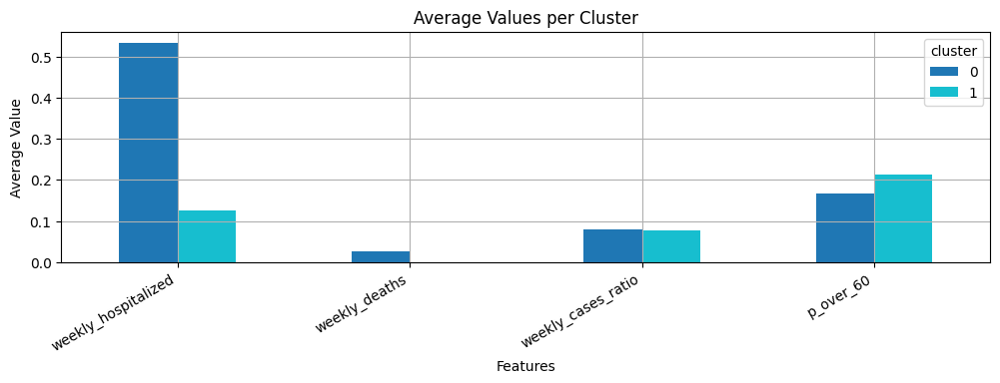

In [311]:
col = ['weekly_recoveries',
       'weekly_tests', 'weekly_vacc_first_dose', 'weekly_vacc_second_dose',
       'weekly_vacc_third_dose', 'latitude', 'longitude',
        'weeks_since_start', 'weekly_cases_change','total_population','weekly_tests'] 

means_per_cluster.drop(columns = col).T.plot(kind='bar', figsize=(12, 3), title="Average Values per Cluster", colormap='tab10')
plt.xlabel("Features")
plt.ylabel("Average Value")
plt.xticks(rotation=30, ha='right')
plt.grid(True)
plt.show()


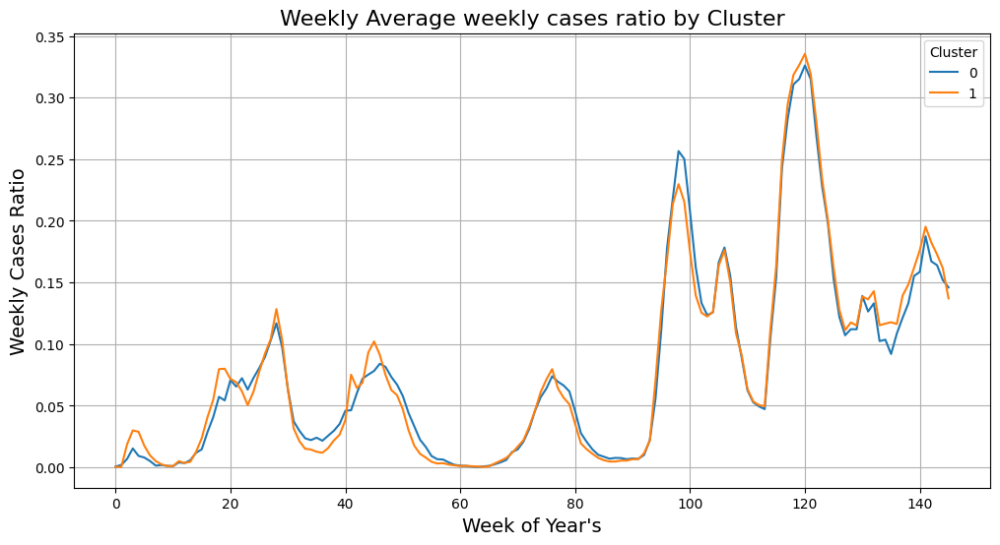

In [326]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['weekly_cases_ratio'].mean().unstack().plot(figsize=(12, 6))
plt.title("Weekly Average weekly cases ratio by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("Weekly Cases Ratio", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


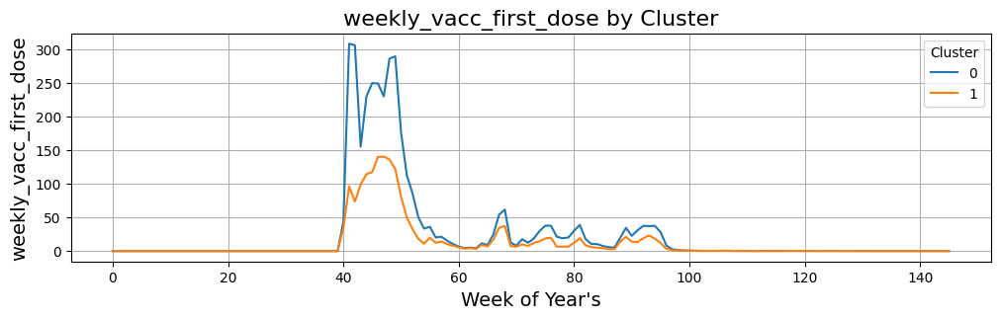

In [316]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['weekly_vacc_first_dose'].mean().unstack().plot(figsize=(12, 3))
plt.title("weekly_vacc_first_dose by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("weekly_vacc_first_dose", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


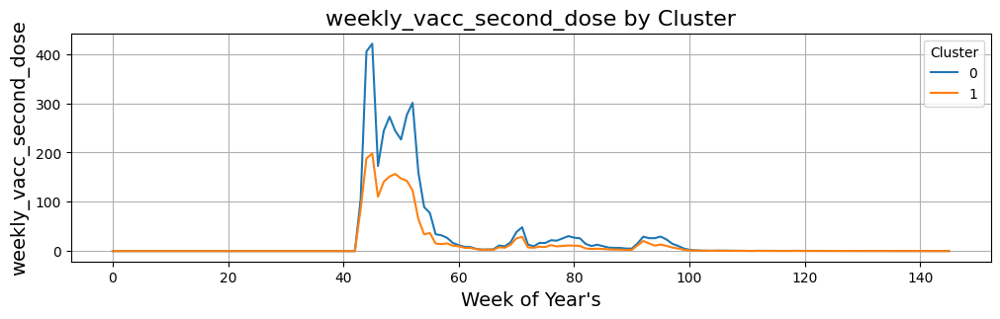

In [317]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['weekly_vacc_second_dose'].mean().unstack().plot(figsize=(12, 3))
plt.title("weekly_vacc_second_dose by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("weekly_vacc_second_dose", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


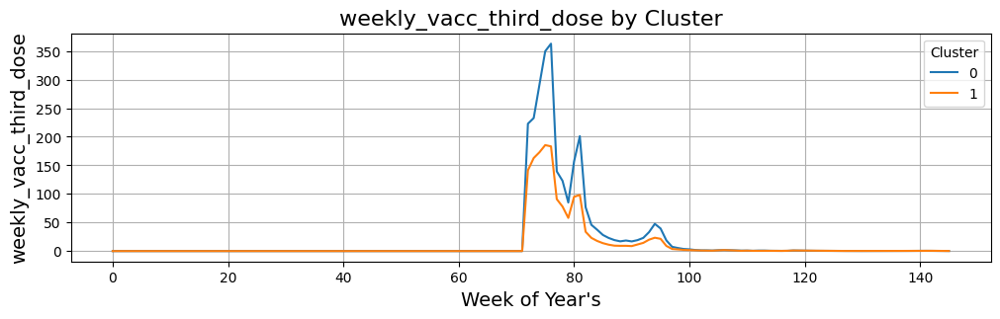

In [318]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['weekly_vacc_third_dose'].mean().unstack().plot(figsize=(12, 3))
plt.title("weekly_vacc_third_dose by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("weekly_vacc_third_dose", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


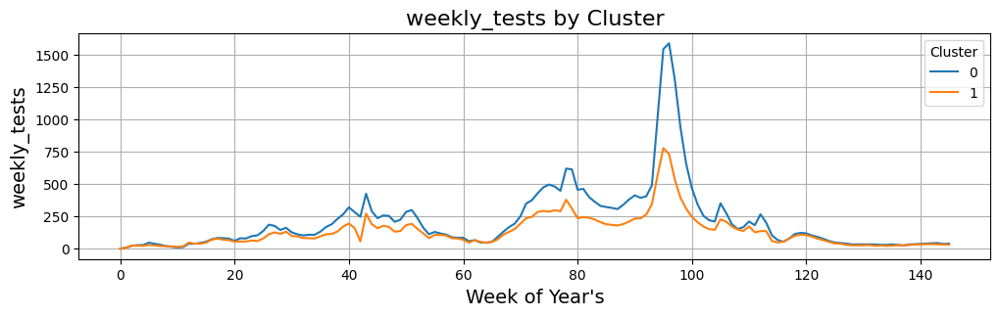

In [319]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['weekly_tests'].mean().unstack().plot(figsize=(12, 3))
plt.title("weekly_tests by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("weekly_tests", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


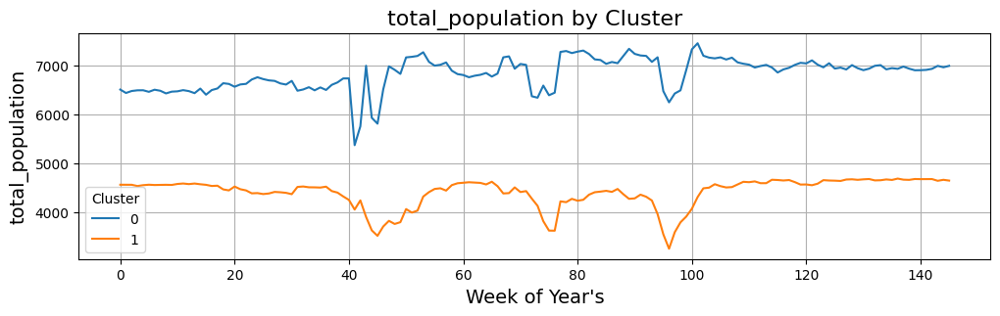

In [320]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['total_population'].mean().unstack().plot(figsize=(12, 3))
plt.title("total_population by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("total_population", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


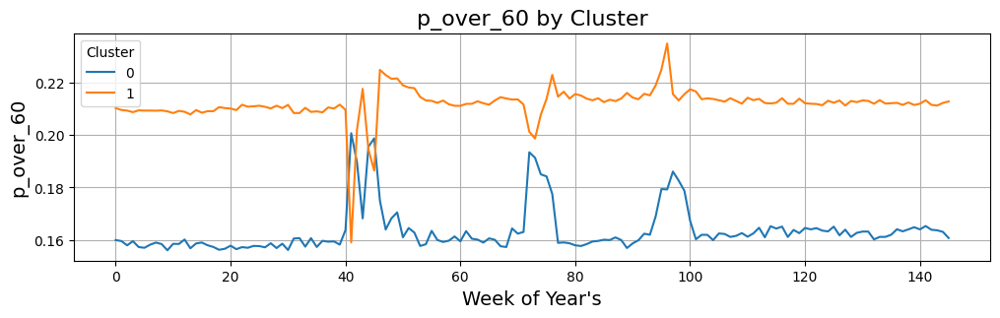

In [321]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['p_over_60'].mean().unstack().plot(figsize=(12, 3))
plt.title("p_over_60 by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("p_over_60", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


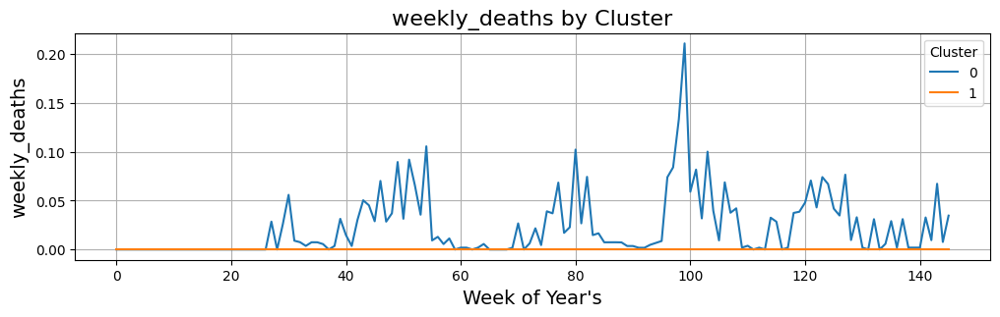

In [322]:
unsup_prepared_data_cluster.groupby(['weeks_since_start', 'cluster'])['weekly_deaths'].mean().unstack().plot(figsize=(12, 3))
plt.title("weekly_deaths by Cluster", fontsize=16)
plt.xlabel("Week of Year's", fontsize=14)
plt.ylabel("weekly_deaths", fontsize=14)
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


In [279]:
unsup_prepared_data_cluster.columns

Index(['weekly_recoveries', 'weekly_hospitalized', 'weekly_deaths',
       'weekly_tests', 'weekly_vacc_first_dose', 'weekly_vacc_second_dose',
       'weekly_vacc_third_dose', 'total_population', 'latitude', 'longitude',
       'weekly_cases_ratio', 'p_over_60', 'simplified_style_code',
       'unique_geo_key', 'weeks_since_start', 'weekly_cases_change',
       'cluster'],
      dtype='object')

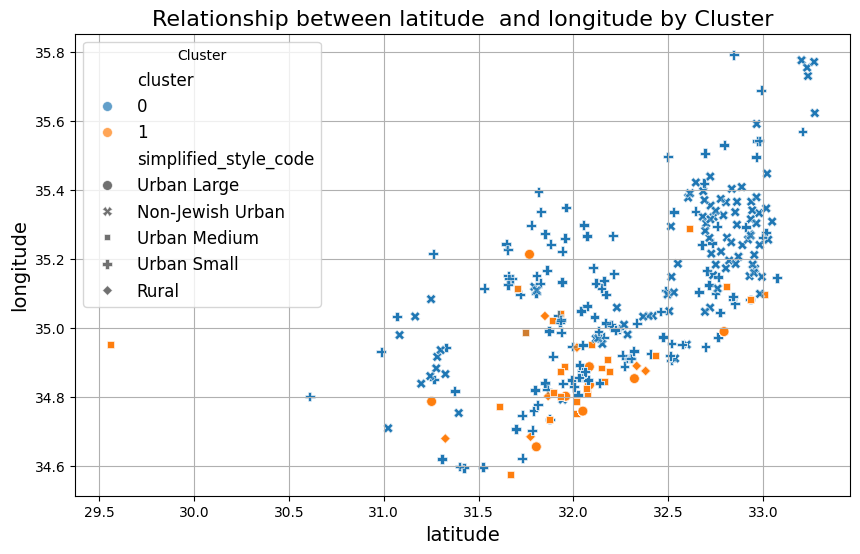

In [323]:
feature1 = ['latitude']
feature2 = ['longitude']

plt.figure(figsize=(10, 6))
sns.scatterplot(
        data=unsup_prepared_data_cluster,
        x= feature1[0], 
        y= feature2[0],
        style='simplified_style_code',
        hue='cluster',  # חלוקה לפי קלסטרים
        palette='tab10',
        alpha=0.7,
        s=50
    )
plt.title(f"Relationship between {feature1[0]}  and {feature2[0]} by Cluster", fontsize=16)
plt.xlabel(f"{feature1[0]}", fontsize=14)
plt.ylabel(f"{feature2[0]}", fontsize=14)
plt.legend(title='Cluster', fontsize=12)
plt.grid(True)
plt.show()

In [324]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
